# Setup

## Imports

In [3]:
# Import Libraries
library(tidyverse)
library(data.table)
library(lme4)
library(car)
library(ggplot2)
library(lmerTest)
library(broom)
library(data.table)
library(pander)
library(emmeans)
library(ggsignif)
library(PerformanceAnalytics)
library(GGally)
#library(Hmisc)

# Load helper functions
source("../r_scripts/helper_functions.R")

## set universal plot size:
options(repr.plot.width=7, repr.plot.height=3.5)

# avoids scientific notation
options(scipen=999) 

── Attaching packages ─────────────────────────────────────── tidyverse 1.2.1 ──
✔ ggplot2 3.1.0     ✔ purrr   0.3.0
✔ tibble  2.0.1     ✔ dplyr   0.7.8
✔ tidyr   0.8.2     ✔ stringr 1.4.0
✔ readr   1.3.1     ✔ forcats 0.3.0
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Attaching package: ‘data.table’

The following objects are masked from ‘package:dplyr’:

    between, first, last

The following object is masked from ‘package:purrr’:

    transpose

Loading required package: Matrix

Attaching package: ‘Matrix’

The following object is masked from ‘package:tidyr’:

    expand

Loading required package: carData

Attaching package: ‘car’

The following object is masked from ‘package:dplyr’:

    recode

The following object is masked from ‘package:purrr’:

    some


Attaching package: ‘lmerTest’

The following object is masked from ‘package:lme4’:

    lmer

The following obj

## Load and manipulate data

### Behavioral

In [4]:
# Load Data
load("../data/FoodRegfMRI_dt.RData")
dt = full_dt

In [5]:
# add some columns and center predictors, remove NA rows
dt = process_data_table(dt)

# Make condition dts
dt_nat = dt[dt$cond == "Respond Naturally",]
dt_health = dt[dt$cond == "Focus on Healthiness",]
dt_dd = dt[dt$cond == "Decrease Desire",]

# means by subject and by condition
  # and calculate health/taste change w/baseline
dt_subj = by_subject(dt)

# Load Hause helper functions (for some reason it breaks the by_subject() function if run first)
source("https://raw.githubusercontent.com/hauselin/Rcode/master/summaryh.R")
source("https://raw.githubusercontent.com/hauselin/Rcode/master/se.R")


  This is piecewiseSEM version 2.0.2

  If you have used the package before, it is strongly recommended you read Section 3 of the vignette('piecewiseSEM') to familiarize yourself with the new syntax

  Questions or bugs can be addressed to <jlefcheck@bigelow.org>
Warning message in checkMatrixPackageVersion():
“Package version inconsistency detected.
TMB was built with Matrix version 1.2.14
Current Matrix version is 1.2.15
Please re-install 'TMB' from source using install.packages('TMB', type = 'source') or ask CRAN for a binary version of 'TMB' matching CRAN's 'Matrix' package”
Attaching package: ‘sjstats’

The following object is masked from ‘package:broom’:

    bootstrap



d: 0.20 (small), 0.50 (medium), .80 (large) (Cohen, 1992)
r: .10 (small), .30 (medium), .50 (large) (Cohen, 1992)
R2: .02 (small), .13 (medium), .26 (large) (Cohen, 1992)


In [6]:
# convert subject and cond to factor
dt$subject = as.factor(dt$subject)
dt$cond = as.factor(dt$cond)

In [7]:
# Use resp instead of choice to calculate slopes
# Natural
model_nc <- glmer(choice ~ taste_c + health_c + (1 + taste_c + health_c|subject),
               data = dt_nat, family = binomial,
               control = glmerControl(optimizer= 'bobyqa'))

model_np <- lmer(resp ~ taste_c + health_c + (1 + taste_c + health_c|subject), 
              data = dt_nat)

model = model_np

dt_subj$intercept[dt_subj$cond=="Respond Naturally"] = coef(model)$subject[,1]
dt_subj$taste_slope[dt_subj$cond=="Respond Naturally"] = coef(model)$subject[,2]
dt_subj$health_slope[dt_subj$cond=="Respond Naturally"] = coef(model)$subject[,3]
  
# Decrease
model_dc <- glmer(choice ~ taste_c + health_c + (1 + taste_c + health_c|subject),
               data = dt_dd, family = binomial,
               control = glmerControl(optimizer= 'bobyqa'))

model_dp <- lmer(resp ~ taste_c + health_c + (1 + taste_c + health_c|subject), 
              data = dt_dd)

model = model_dp

dt_subj$intercept[dt_subj$cond=="Decrease Desire"] = coef(model)$subject[,1]
dt_subj$taste_slope[dt_subj$cond=="Decrease Desire"] = coef(model)$subject[,2]
dt_subj$health_slope[dt_subj$cond=="Decrease Desire"] = coef(model)$subject[,3]


# Health
model_hc <- glmer(choice ~ taste_c + health_c + (1 + taste_c + health_c|subject),
               data = dt_health, family = binomial,
               control = glmerControl(optimizer= 'bobyqa'))

model_hp <- lmer(resp ~ taste_c + health_c + (1 + taste_c + health_c|subject), 
              data = dt_health)

model = model_hp

dt_subj$intercept[dt_subj$cond=="Focus on Healthiness"] = coef(model)$subject[,1]
dt_subj$taste_slope[dt_subj$cond=="Focus on Healthiness"] = coef(model)$subject[,2]
dt_subj$health_slope[dt_subj$cond=="Focus on Healthiness"] = coef(model)$subject[,3]

# model with everything
# model_all <- lmer(resp ~ taste_c + health_c + cond + (1 + taste_c + health_c + cond|subject), data = dt)

# summary(model_all)

# Calculate difference of slopes with baseline (natural)
dt_subj = dt_subj %>%
  group_by(subject) %>%
  mutate( health_slope_change = health_slope - health_slope[cond=="Respond Naturally"],
          taste_slope_change = taste_slope - taste_slope[cond=="Respond Naturally"]
  )

# Label based on regulatory success (3 categories)
dt_subj = dt_subj %>%
  group_by(cond) %>%
  mutate( health_slope_change_cat = ntile(health_slope_change, 3),
          taste_slope_change_cat = ntile(taste_slope_change, 3)
  )

# Apply labels to original long dataframe
dt_merged = merge(dt, dt_subj, by=c("subject", "cond"))

Warning message:
“Unknown or uninitialised column: 'intercept'.”Warning message:
“Unknown or uninitialised column: 'taste_slope'.”Warning message:
“Unknown or uninitialised column: 'health_slope'.”

In [8]:
head(dt_merged, 5)

subject,cond,food,block,resp.x,rt.x,pre_liking.x,post_liking.x,taste.x,health.x,⋯,choice.y,post_pre.y,post_pre_c.y,intercept,taste_slope,health_slope,health_slope_change,taste_slope_change,health_slope_change_cat,taste_slope_change_cat
101,Decrease Desire,ProMax_4_1bar.jpg,3,2,0.8472029,4,3,3,3,⋯,0.2666667,-0.2,0.01022349,1.963392,0.3174135,0.07434354,-0.02989023,-0.09816493,1,2
101,Decrease Desire,TeriyakiJerky_2_1pc.jpg,7,1,1.1951755,3,2,2,4,⋯,0.2666667,-0.2,0.01022349,1.963392,0.3174135,0.07434354,-0.02989023,-0.09816493,1,2
101,Decrease Desire,SkittlesSour_6_0.5pack.jpg,3,1,0.8027384,3,3,3,1,⋯,0.2666667,-0.2,0.01022349,1.963392,0.3174135,0.07434354,-0.02989023,-0.09816493,1,2
101,Decrease Desire,RufflesSourCreamOnion_3_5chips.jpg,6,2,0.9040389,5,5,4,3,⋯,0.2666667,-0.2,0.01022349,1.963392,0.3174135,0.07434354,-0.02989023,-0.09816493,1,2
101,Decrease Desire,AllBranCereal_2_1tbsp.jpg,5,2,1.0302339,4,4,4,5,⋯,0.2666667,-0.2,0.01022349,1.963392,0.3174135,0.07434354,-0.02989023,-0.09816493,1,2


### Neural (ROIs)

In [9]:
# location of roi analyses outputs
maskDir = '/Volumes/DJW_Lacie_01/PROJECTS/2018_Food_Reg_fMRI/09_DATA/food_reg_fmri_01/analysis/SPM/fmasks/'

#### vmPFC

In [10]:
# vmPFC mask
mask = 'vmPFC_sphere_6mm_image_-4_36_12_1_Preference_All-Preference'

In [11]:
# Preference model
model = '1_Preference'
contrast = 'preference'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
vmPFC_pref = read.table(fileName, sep = "\t", header = TRUE)

contrast = 'main'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
vmPFC_main = read.table(fileName, sep = "\t", header = TRUE)

In [12]:
# Taste and Health model
model = '2_taste_a_health'
contrast = 'TasteHealth'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
vmPFC_taste_health = read.table(fileName, sep = "\t", header = TRUE)

In [13]:
# Preference and Pre - Post model
model = '4_preference_a_pre_m_post'
contrast = 'PrePostSuccess'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
vmPFC_pre_m_post = read.table(fileName, sep = "\t", header = TRUE)

In [14]:
# Preference and Reg Success lasting
model = '5_preference_a_reg_success_lasting'
contrast = 'PrePostSuccess'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
vmPFC_lasting_success = read.table(fileName, sep = "\t", header = TRUE)

In [15]:
# Join dfs in to one vmPFC df 
vmPFC = vmPFC_main %>% 
    left_join(vmPFC_pref) %>% 
    left_join(vmPFC_taste_health) %>% 
    left_join(vmPFC_pre_m_post) %>%
    left_join(vmPFC_lasting_success) %>%
    select(-X) %>%
    mutate(roi = "vmPFC")

Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")


In [16]:
head(vmPFC,3)

Subject,Natural,Decrease,Health,Natural.Preference,Decrease.Preference,Health.Preference,Natural.Taste,Natural.Health,Decrease.Taste,Decrease.Health,Health.Taste,Health.Health,Natural.pre_m_post,Decrease.pre_m_post,Health.pre_m_post,Natural.reg_success_lasting,Decrease.reg_success_lasting,Health.reg_success_lasting,roi
101,11.8387,7.9307,20.5904,6.5749,0.1053,7.5976,3.7952,-1.3264,0.4590,-3.3945,2.3949,-0.3947,-3.4483,-0.2285,-3.6873,2.4299,-4.7984,6.6694,vmPFC
102,18.0133,5.3437,4.2245,1.5320,11.2702,3.0762,1.1856,1.7963,2.9610,1.3921,3.5736,0.2352,1.5392,3.0301,-1.1638,-4.5882,-2.9443,1.5033,vmPFC
103,6.0656,16.1751,27.0601,-1.9928,-0.6882,7.6369,7.8192,-0.6958,2.0651,-3.2444,4.0887,-2.3075,6.8747,2.0688,-0.0702,-1.2652,-6.4971,-4.2331,vmPFC


#### vmPFC (small volume corrected)

---
Using `vmPFC_BartraClitheroMeta` initially to find significant activation, and then choosing the active clusters to analyze...

##### Health.HvN

In [94]:
# vmPFC small volume selected mask for HvN
mask = 'vmPFC_HealthHvN_p001'

In [95]:
# Preference model
model = '1_Preference'
contrast = 'preference'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
vmPFC_HvN_pref = read.table(fileName, sep = "\t", header = TRUE)

contrast = 'main'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
vmPFC_HvN_main = read.table(fileName, sep = "\t", header = TRUE)

In [96]:
# Taste and Health model
model = '2_taste_a_health'
contrast = 'TasteHealth'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
vmPFC_HvN_taste_health = read.table(fileName, sep = "\t", header = TRUE)

In [97]:
# Join dfs in to one vmPFC df 
vmPFC_HvN = vmPFC_HvN_main %>% 
    left_join(vmPFC_HvN_pref) %>% 
    left_join(vmPFC_HvN_taste_health) %>% 
    select(-X) %>%
    mutate(roi = "vmPFC_HvN")

Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")


##### Main.HvN

In [98]:
# vmPFC small volume selected mask for DvN
mask = 'vmPFC_MainDvN_p001'

In [99]:
# Preference model
model = '1_Preference'
contrast = 'preference'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
vmPFC_DvN_pref = read.table(fileName, sep = "\t", header = TRUE)

contrast = 'main'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
vmPFC_DvN_main = read.table(fileName, sep = "\t", header = TRUE)

In [100]:
# Taste and Health model
model = '2_taste_a_health'
contrast = 'TasteHealth'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
vmPFC_DvN_taste_health = read.table(fileName, sep = "\t", header = TRUE)

In [101]:
# Join dfs in to one vmPFC df 
vmPFC_DvN = vmPFC_DvN_main %>% 
    left_join(vmPFC_DvN_pref) %>% 
    left_join(vmPFC_DvN_taste_health) %>% 
    select(-X) %>%
    mutate(roi = "vmPFC_DvN")

Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")


#### r_dlPFC

In [17]:
# r_dlPFC mask
mask = 'R_dlPFC_sphere_6mm_image_-42_36_18_1_Preference_All-Preference'

In [18]:
# Preference model
model = '1_Preference'
contrast = 'preference'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
r_dlPFC_pref = read.table(fileName, sep = "\t", header = TRUE)

contrast = 'main'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
r_dlPFC_main = read.table(fileName, sep = "\t", header = TRUE)

In [19]:
# Taste and Health model
model = '2_taste_a_health'
contrast = 'TasteHealth'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
r_dlPFC_taste_health = read.table(fileName, sep = "\t", header = TRUE)

In [20]:
# Preference and Pre - Post model
model = '4_preference_a_pre_m_post'
contrast = 'PrePostSuccess'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
r_dlPFC_pre_m_post = read.table(fileName, sep = "\t", header = TRUE)

In [21]:
# Preference and Reg Success lasting
model = '5_preference_a_reg_success_lasting'
contrast = 'PrePostSuccess'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
r_dlPFC_lasting_success = read.table(fileName, sep = "\t", header = TRUE)

In [22]:
# Join dfs in to one vmPFC df 
r_dlPFC = r_dlPFC_main %>% 
    left_join(r_dlPFC_pref) %>% 
    left_join(r_dlPFC_taste_health) %>% 
    left_join(r_dlPFC_pre_m_post) %>%
    left_join(r_dlPFC_lasting_success) %>%
    select(-X) %>%
    mutate(roi = "R_dlPFC")

Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")


In [23]:
head(r_dlPFC, 3)

Subject,Natural,Decrease,Health,Natural.Preference,Decrease.Preference,Health.Preference,Natural.Taste,Natural.Health,Decrease.Taste,Decrease.Health,Health.Taste,Health.Health,Natural.pre_m_post,Decrease.pre_m_post,Health.pre_m_post,Natural.reg_success_lasting,Decrease.reg_success_lasting,Health.reg_success_lasting,roi
101,13.5968,14.1378,27.3059,2.4800,9.9742,5.6013,-1.5452,2.3356,2.3179,-0.3286,6.6953,1.2654,-0.4400,-1.7084,-4.2441,-8.7984,-3.4694,3.0656,R_dlPFC
102,23.6603,12.8809,26.3884,-4.3991,4.7704,7.1239,-0.5774,3.4170,0.2873,0.6051,3.1192,2.8336,1.9399,0.9201,0.8902,-4.1149,1.9615,2.9972,R_dlPFC
103,2.3742,1.0675,19.2981,-1.2429,10.1354,15.2194,1.3559,-3.6181,5.0571,-5.2519,2.1495,2.6094,8.2076,3.7510,8.7176,1.4568,-1.6756,-0.2305,R_dlPFC


#### l_dlPFC

In [24]:
# l_dlPFC mask
mask = 'L_dlPFC_sphere_6mm_image_-54_24_36_1_Preference_All-Preference'

In [25]:
# Preference model
model = '1_Preference'
contrast = 'preference'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_dlPFC_pref = read.table(fileName, sep = "\t", header = TRUE)

contrast = 'main'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_dlPFC_main = read.table(fileName, sep = "\t", header = TRUE)

In [26]:
# Taste and Health model
model = '2_taste_a_health'
contrast = 'TasteHealth'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_dlPFC_taste_health = read.table(fileName, sep = "\t", header = TRUE)

In [27]:
# Preference and Pre - Post model
model = '4_preference_a_pre_m_post'
contrast = 'PrePostSuccess'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_dlPFC_pre_m_post = read.table(fileName, sep = "\t", header = TRUE)

In [28]:
# Preference and Reg Success lasting
model = '5_preference_a_reg_success_lasting'
contrast = 'PrePostSuccess'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_dlPFC_lasting_success = read.table(fileName, sep = "\t", header = TRUE)

In [29]:
# Join dfs in to one vmPFC df 
l_dlPFC = l_dlPFC_main %>% 
    left_join(l_dlPFC_pref) %>% 
    left_join(l_dlPFC_taste_health) %>% 
    left_join(l_dlPFC_pre_m_post) %>%
    left_join(l_dlPFC_lasting_success) %>%
    select(-X) %>%
    mutate(roi = "L_dlPFC")

Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")


In [30]:
head(l_dlPFC, 3)

Subject,Natural,Decrease,Health,Natural.Preference,Decrease.Preference,Health.Preference,Natural.Taste,Natural.Health,Decrease.Taste,Decrease.Health,Health.Taste,Health.Health,Natural.pre_m_post,Decrease.pre_m_post,Health.pre_m_post,Natural.reg_success_lasting,Decrease.reg_success_lasting,Health.reg_success_lasting,roi
101,9.4077,11.7263,16.0799,2.0394,13.2645,5.5239,-0.6800,-1.8627,4.1606,0.4817,3.5334,5.5346,-4.3700,-1.0085,-0.8946,-4.6596,-5.6237,4.1305,L_dlPFC
102,44.6043,33.1112,48.9745,0.1979,2.3706,4.5881,5.0674,4.5109,0.3867,-0.5154,5.6868,4.4081,-1.7938,0.7803,5.0447,3.0563,4.5821,4.8904,L_dlPFC
103,12.6930,14.7067,26.5938,6.8774,10.9480,14.8223,-4.4878,1.2337,-3.1369,-9.0659,6.3923,4.6141,-3.2007,7.7484,5.5591,7.0665,-0.4136,6.5592,L_dlPFC


#### L TPJ

In [31]:
# l TPJ mask
mask = 'L_TPJ_sphere_6mm_-54_-62_30'

In [32]:
# Preference model
model = '1_Preference'
contrast = 'preference'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_TPJ_pref = read.table(fileName, sep = "\t", header = TRUE)

contrast = 'main'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_TPJ_main = read.table(fileName, sep = "\t", header = TRUE)

In [33]:
# Taste and Health model
model = '2_taste_a_health'
contrast = 'TasteHealth'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_TPJ_taste_health = read.table(fileName, sep = "\t", header = TRUE)

In [34]:
# Preference and Pre - Post model
model = '4_preference_a_pre_m_post'
contrast = 'PrePostSuccess'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_TPJ_pre_m_post = read.table(fileName, sep = "\t", header = TRUE)

In [35]:
# Preference and Reg Success lasting
model = '5_preference_a_reg_success_lasting'
contrast = 'PrePostSuccess'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_TPJ_lasting_success = read.table(fileName, sep = "\t", header = TRUE)

In [36]:
# Join dfs in to one vmPFC df 
l_TPJ = l_TPJ_main %>% 
    left_join(l_TPJ_pref) %>% 
    left_join(l_TPJ_taste_health) %>% 
    left_join(l_TPJ_pre_m_post) %>%
    left_join(l_TPJ_lasting_success) %>%
    select(-X) %>%
    mutate(roi = "L_TPJ")

Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")


In [37]:
head(l_TPJ,3)

Subject,Natural,Decrease,Health,Natural.Preference,Decrease.Preference,Health.Preference,Natural.Taste,Natural.Health,Decrease.Taste,Decrease.Health,Health.Taste,Health.Health,Natural.pre_m_post,Decrease.pre_m_post,Health.pre_m_post,Natural.reg_success_lasting,Decrease.reg_success_lasting,Health.reg_success_lasting,roi
101,11.4729,0.8512,6.4149,0.4609,2.4345,0.3461,0.6241,-2.1778,0.5556,5.7260,-0.1519,0.4115,0.3933,7.1671,-2.6006,1.9163,-1.9782,-6.1710,L_TPJ
102,-13.4240,-14.1256,-7.4314,1.8409,3.2682,-0.9335,-1.1702,0.4905,1.2229,0.1990,-0.9393,1.1614,-5.3991,1.1337,0.1937,-6.4105,0.3120,0.9190,L_TPJ
103,-5.5218,-7.8330,7.3775,-5.5142,2.1856,12.3334,-10.4667,0.1174,0.3023,-5.9341,2.9718,-0.2870,11.4984,4.4758,1.4188,-0.2245,-8.2931,-3.6856,L_TPJ


#### L vlPFC

In [38]:
# vmPFC mask
mask = 'L_vlPFC_sphere_6--48_50_-10'

In [39]:
# Preference model
model = '1_Preference'
contrast = 'preference'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_vlPFC_pref = read.table(fileName, sep = "\t", header = TRUE)

contrast = 'main'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_vlPFC_main = read.table(fileName, sep = "\t", header = TRUE)

In [40]:
# Taste and Health model
model = '2_taste_a_health'
contrast = 'TasteHealth'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_vlPFC_taste_health = read.table(fileName, sep = "\t", header = TRUE)

In [41]:
# Preference and Pre - Post model
model = '4_preference_a_pre_m_post'
contrast = 'PrePostSuccess'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_vlPFC_pre_m_post = read.table(fileName, sep = "\t", header = TRUE)

In [42]:
# Preference and Reg Success lasting
model = '5_preference_a_reg_success_lasting'
contrast = 'PrePostSuccess'

fileName = paste(maskDir, mask, '/', mask, model, contrast, '.txt', sep = "")
l_vlPFC_lasting_success = read.table(fileName, sep = "\t", header = TRUE)

In [43]:
# Join dfs in to one vmPFC df 
l_vlPFC = l_vlPFC_main %>% 
    left_join(l_vlPFC_pref) %>% 
    left_join(l_vlPFC_taste_health) %>% 
    left_join(l_vlPFC_pre_m_post) %>%
    left_join(l_vlPFC_lasting_success) %>%
    select(-X) %>%
    mutate(roi = "L_vlPFC")

Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")
Joining, by = c("Subject", "X")


In [44]:
head(l_vlPFC,3)

Subject,Natural,Decrease,Health,Natural.Preference,Decrease.Preference,Health.Preference,Natural.Taste,Natural.Health,Decrease.Taste,Decrease.Health,Health.Taste,Health.Health,Natural.pre_m_post,Decrease.pre_m_post,Health.pre_m_post,Natural.reg_success_lasting,Decrease.reg_success_lasting,Health.reg_success_lasting,roi
101,9.1016,12.2685,14.3535,0.9235,11.6245,1.7552,-0.7601,0.0843,4.8411,4.2476,2.8974,0.8546,-4.3892,3.5323,2.0422,3.3910,-4.2561,0.8117,L_vlPFC
102,8.1619,7.3883,12.6691,-0.6964,2.4691,0.5992,3.3459,1.8327,1.1964,2.2476,0.3949,0.6529,-0.0647,2.6389,-0.6574,3.1778,3.1931,1.8228,L_vlPFC
103,3.5806,-3.5166,12.8871,0.1668,1.7238,9.5627,7.0312,3.1424,-3.3003,-2.0936,-1.0279,5.4500,2.0240,-0.7944,-1.0641,4.2632,-2.0290,-1.4602,L_vlPFC


#### Merge DF

In [103]:
rois = rbind(vmPFC, r_dlPFC, l_dlPFC, l_TPJ, l_vlPFC)
head(rois,3)

Subject,Natural,Decrease,Health,Natural.Preference,Decrease.Preference,Health.Preference,Natural.Taste,Natural.Health,Decrease.Taste,Decrease.Health,Health.Taste,Health.Health,Natural.pre_m_post,Decrease.pre_m_post,Health.pre_m_post,Natural.reg_success_lasting,Decrease.reg_success_lasting,Health.reg_success_lasting,roi
101,11.8387,7.9307,20.5904,6.5749,0.1053,7.5976,3.7952,-1.3264,0.4590,-3.3945,2.3949,-0.3947,-3.4483,-0.2285,-3.6873,2.4299,-4.7984,6.6694,vmPFC
102,18.0133,5.3437,4.2245,1.5320,11.2702,3.0762,1.1856,1.7963,2.9610,1.3921,3.5736,0.2352,1.5392,3.0301,-1.1638,-4.5882,-2.9443,1.5033,vmPFC
103,6.0656,16.1751,27.0601,-1.9928,-0.6882,7.6369,7.8192,-0.6958,2.0651,-3.2444,4.0887,-2.3075,6.8747,2.0688,-0.0702,-1.2652,-6.4971,-4.2331,vmPFC


In [53]:
# convert subject and roi to factors
rois$Subject = as.factor(rois$Subject)
rois$roi = as.factor(rois$roi)

# ROI Analyses

## Effects By Condition

### Main

In [55]:
# make long df
df = rois %>%
    select(Subject, roi, Natural, Decrease, Health) %>%
    gather("cond", "activation", Natural:Health)


In [56]:
df$cond = factor(df$cond, levels=c("Natural", "Health", "Decrease"))

In [57]:
for (mask in c("vmPFC", "R_dlPFC", "L_dlPFC", "L_TPJ", "L_vlPFC")){
    # anova
    cond.aov = aov(activation ~ cond + Error(Subject),
                   contrasts = list(cond = "contr.sum"),
                   data = filter(df, roi==mask))
    print(mask)
    print("ANOVA")
    print(summary(cond.aov))

    # check for pairwise differences
    cond.emm = emmeans(cond.aov, list(pairwise ~ cond), adjust = "tukey")
    print("Pairwise Comparison (Tukey Corrected)")
    print(summary(cond.emm$`pairwise differences of cond`))
}


[1] "vmPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49   4377   89.33               

Error: Within
          Df Sum Sq Mean Sq F value Pr(>F)
cond       2  110.8   55.41   1.943  0.149
Residuals 98 2794.1   28.51               
[1] "Pairwise Comparison (Tukey Corrected)"
 contrast           estimate       SE df t.ratio p.value
 Natural - Health   0.109204 1.067923 98   0.102  0.9943
 Natural - Decrease 1.875426 1.067923 98   1.756  0.1899
 Health - Decrease  1.766222 1.067923 98   1.654  0.2283

P value adjustment: tukey method for comparing a family of 3 estimates 
[1] "R_dlPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49  11987   244.6               

Error: Within
          Df Sum Sq Mean Sq F value Pr(>F)  
cond       2  165.3   82.67   4.285 0.0164 *
Residuals 98 1890.6   19.29                 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
[1] "Pairwise Comparison (Tukey Correcte

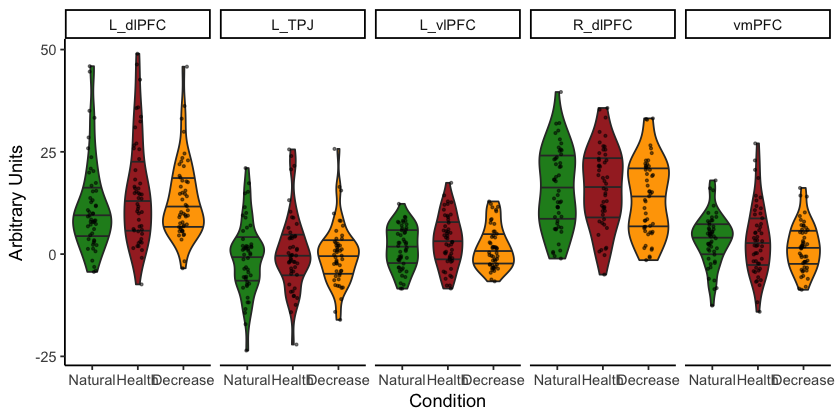

In [58]:
# Plot 
plot = ggplot(df, aes(cond, activation, fill = cond)) +
    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75), size=0.5, alpha=1, show.legend = F) + #draw_quantiles = c(0.5)
    #geom_errorbar(aes(ymin = choice-se, ymax = choice+se), width=0.2, data=accept_rate_group) +
    #geom_boxplot(width = .3) +
    geom_jitter(height = 0, width = 0.1, size = 0.5, alpha=0.5, show.legend = F) +
    xlab("Condition") +
    ylab("Arbitrary Units") +
    scale_fill_manual(values = c("forestgreen", "brown", "orange")) +
    theme_classic()

#plot + facet_grid(roi ~ .)
plot + facet_grid(. ~ roi)

# plot + 
#     geom_signif(annotations = c("n.s", "n.s.", "n.s"),
#               y_position = c(20, 29, 32), xmin=c(1,2,1), xmax=c(2,3,3))

#### Main: vmPFC DVN

In [106]:
# make long df
df = vmPFC_DvN %>%
    select(Subject, Natural, Decrease, Health) %>%
    gather("cond", "activation", Natural:Health)


In [107]:
df$cond = factor(df$cond, levels=c("Natural", "Health", "Decrease"))
df$Subject = as.factor(df$Subject)

In [108]:
# Anova
cond.aov = aov(activation ~ cond + Error(Subject),
               contrasts = list(cond = "contr.sum"),
               data = filter(df))
print(summary(cond.aov))

# check for pairwise differences
cond.emm = emmeans(cond.aov, list(pairwise ~ cond), adjust = "tukey")
print("Pairwise Comparison (Tukey Corrected)")
print(summary(cond.emm$`pairwise differences of cond`))


Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49   5458   111.4               

Error: Within
          Df Sum Sq Mean Sq F value  Pr(>F)   
cond       2  224.4  112.19   4.838 0.00991 **
Residuals 98 2272.4   23.19                   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
[1] "Pairwise Comparison (Tukey Corrected)"
 contrast           estimate        SE df t.ratio p.value
 Natural - Health   1.660196 0.9630637 98   1.724  0.2015
 Natural - Decrease 2.989754 0.9630637 98   3.104  0.0070
 Health - Decrease  1.329558 0.9630637 98   1.381  0.3550

P value adjustment: tukey method for comparing a family of 3 estimates 


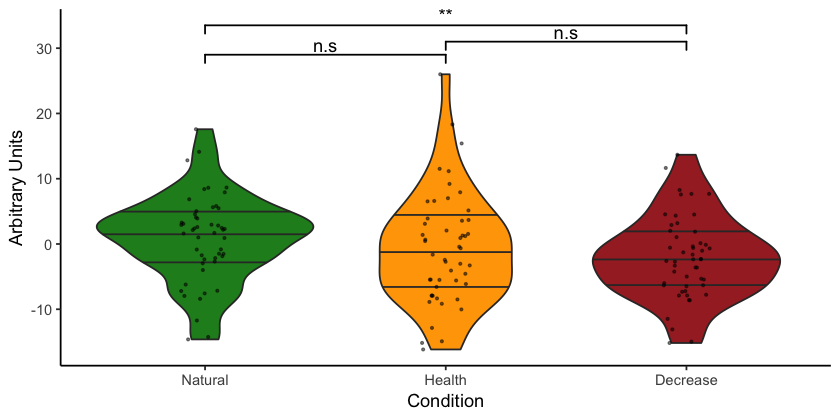

In [114]:
# Plot vmPFC DvN
plot = ggplot(df, aes(cond, activation, fill = cond)) +
    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75), size=0.5, 
                alpha=1, show.legend = F) + #draw_quantiles = c(0.5)
    #geom_errorbar(aes(ymin = choice-se, ymax = choice+se), width=0.2, data=accept_rate_group) +
    #geom_boxplot(width = .3) +
    geom_jitter(height = 0, width = 0.1, size = 0.5, alpha=0.5, show.legend = F) +
    xlab("Condition") +
    ylab("Arbitrary Units") +
    scale_fill_manual(values = c("forestgreen", "orange", "brown")) +
    theme_classic()

plot + 
    geom_signif(annotations = c("n.s", "n.s", "**"),
              y_position = c(29, 31, 33.5), xmin=c(1,2,1), xmax=c(2,3,3))

ggsave("../../3_4_outputs/plots/neural_sv_vmPFC_DvN_main.pdf", width = 20, height = 15, units = "cm")

### Preference

In [59]:
# make long df
df = rois %>%
    select(Subject, roi, 
           Natural.Preference, Decrease.Preference, Health.Preference) %>%
    gather("cond", "activation",
          Natural.Preference:Health.Preference)

In [60]:
df$cond = factor(df$cond, 
                 levels=c("Natural.Preference", 
                          "Health.Preference",
                         "Decrease.Preference"),
                labels=c("Natural", "Health", "Decrease"))

In [61]:
for (mask in c("vmPFC", "R_dlPFC", "L_dlPFC", "L_TPJ", "L_vlPFC")){
    # anova
    cond.aov = aov(activation ~ cond + Error(Subject), 
                   contrasts = list(cond = "contr.sum"),
                   data = filter(df, roi==mask))
    print(mask)
    print("ANOVA")
    print(summary(cond.aov))

    # check for pairwise differences
    cond.emm = emmeans(cond.aov, list(pairwise ~ cond), adjust = "tukey")
    print("Pairwise Comparison (Tukey Corrected)")
    print(summary(cond.emm$`pairwise differences of cond`))
}


[1] "vmPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49  752.1   15.35               

Error: Within
          Df Sum Sq Mean Sq F value Pr(>F)
cond       2   14.1   7.057   0.506  0.605
Residuals 98 1367.9  13.958               
[1] "Pairwise Comparison (Tukey Corrected)"
 contrast            estimate        SE df t.ratio p.value
 Natural - Health    0.734886 0.7472191 98   0.983  0.5890
 Natural - Decrease  0.231924 0.7472191 98   0.310  0.9483
 Health - Decrease  -0.502962 0.7472191 98  -0.673  0.7796

P value adjustment: tukey method for comparing a family of 3 estimates 
[1] "R_dlPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49  650.8   13.28               

Error: Within
          Df Sum Sq Mean Sq F value Pr(>F)
cond       2    4.1    2.06   0.154  0.858
Residuals 98 1311.6   13.38               
[1] "Pairwise Comparison (Tukey Corrected)"
 contrast            estimate        SE df t.ratio p.value
 N

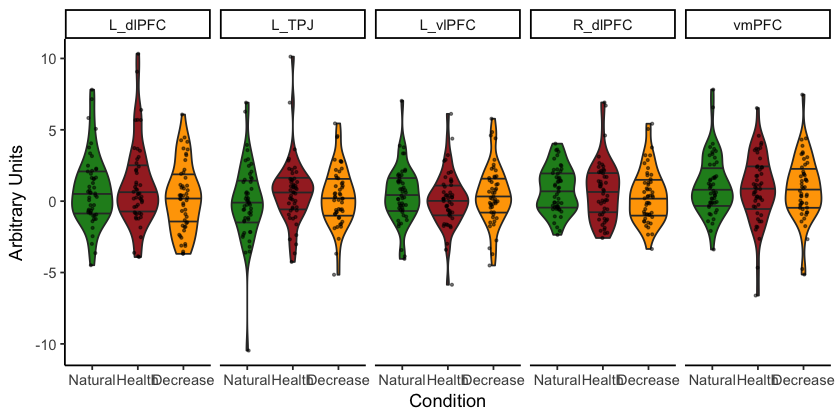

In [154]:
# Plot 
plot = ggplot(df, aes(cond, activation, fill = cond)) +
    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75), size=0.5, alpha=1, show.legend = F) + #draw_quantiles = c(0.5)
    #geom_errorbar(aes(ymin = choice-se, ymax = choice+se), width=0.2, data=accept_rate_group) +
    #geom_boxplot(width = .3) +
    geom_jitter(height = 0, width = 0.1, size = 0.5, alpha=0.5, show.legend = F) +
    xlab("Condition") +
    ylab("Arbitrary Units") +
    scale_fill_manual(values = c("forestgreen", "brown", "orange")) +
    theme_classic()

#plot + facet_grid(roi ~ .)
plot + facet_grid(. ~ roi)

# plot + 
#     geom_signif(annotations = c("n.s", "n.s.", "n.s"),
#               y_position = c(13, 15, 17), xmin=c(1,2,1), xmax=c(2,3,3))

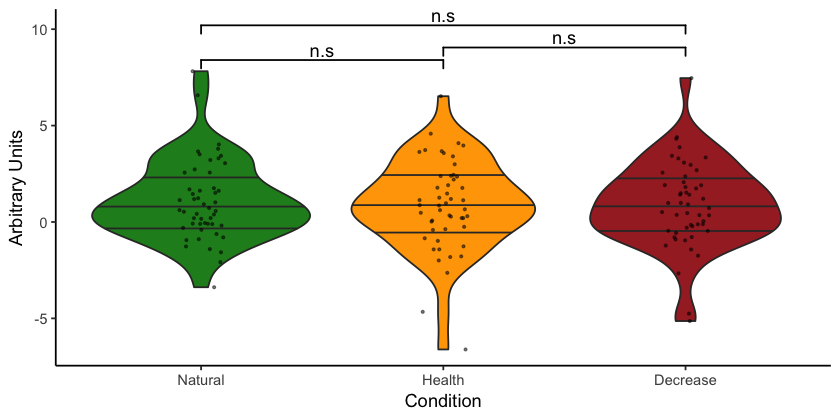

In [157]:
# Plot only vmPFC
plot = ggplot(df[df$roi=="vmPFC",], aes(cond, activation, fill = cond)) +
    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75), size=0.5, 
                alpha=1, show.legend = F) + #draw_quantiles = c(0.5)
    #geom_errorbar(aes(ymin = choice-se, ymax = choice+se), width=0.2, data=accept_rate_group) +
    #geom_boxplot(width = .3) +
    geom_jitter(height = 0, width = 0.1, size = 0.5, alpha=0.5, show.legend = F) +
    xlab("Condition") +
    ylab("Arbitrary Units") +
    scale_fill_manual(values = c("forestgreen", "orange", "brown")) +
    theme_classic()

plot + 
    geom_signif(annotations = c("n.s", "n.s", "n.s"),
              y_position = c(8.4, 9.05, 10.2), xmin=c(1,2,1), xmax=c(2,3,3))

ggsave("../../3_4_outputs/plots/neural_vmPFC_preference.pdf", width = 20, height = 15, units = "cm")

### Health Attribute

In [62]:
# make long df
df = rois %>%
    select(Subject, roi, 
           Natural.Health, Decrease.Health, Health.Health) %>%
    gather("cond", "activation",
          Natural.Health:Health.Health)

In [63]:
df$cond = factor(df$cond, 
                 levels=c("Natural.Health", 
                          "Health.Health",
                         "Decrease.Health"),
                labels=c("Natural", "Health", "Decrease"))

In [64]:
for (mask in c("vmPFC", "R_dlPFC", "L_dlPFC", "L_TPJ", "L_vlPFC")){
    # anova
    cond.aov = aov(activation ~ cond + Error(Subject), 
                   contrasts = list(cond = "contr.sum"),
                   data = filter(df, roi==mask))
    print(mask)
    print("ANOVA")
    print(summary(cond.aov))

    # check for pairwise differences
    cond.emm = emmeans(cond.aov, list(pairwise ~ cond), adjust = "tukey")
    print("Pairwise Comparison (Tukey Corrected)")
    print(summary(cond.emm$`pairwise differences of cond`))
}


[1] "vmPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49  215.7   4.402               

Error: Within
          Df Sum Sq Mean Sq F value    Pr(>F)    
cond       2   75.0   37.49   10.17 0.0000971 ***
Residuals 98  361.4    3.69                      
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
[1] "Pairwise Comparison (Tukey Corrected)"
 contrast            estimate        SE df t.ratio p.value
 Natural - Health   -1.014922 0.3840462 98  -2.643  0.0257
 Natural - Decrease  0.707894 0.3840462 98   1.843  0.1610
 Health - Decrease   1.722816 0.3840462 98   4.486  0.0001

P value adjustment: tukey method for comparing a family of 3 estimates 
[1] "R_dlPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49  167.4   3.417               

Error: Within
          Df Sum Sq Mean Sq F value Pr(>F)  
cond       2   19.9   9.974   2.974 0.0557 .
Residuals 98  328.6   3.354                 
---
Signif.

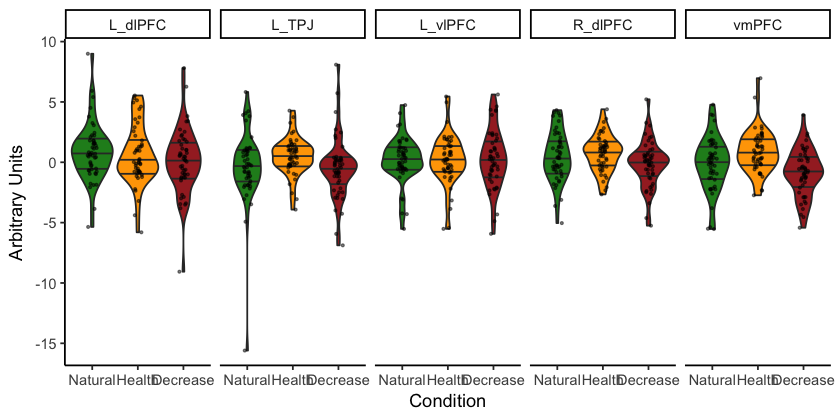

In [161]:
# Plot 
plot = ggplot(df, aes(cond, activation, fill = cond)) +
    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75), size=0.5, 
                alpha=1, show.legend = F) + #draw_quantiles = c(0.5)
    #geom_errorbar(aes(ymin = choice-se, ymax = choice+se), width=0.2, data=accept_rate_group) +
    #geom_boxplot(width = .3) +
    geom_jitter(height = 0, width = 0.1, size = 0.5, alpha=0.5, show.legend = F) +
    xlab("Condition") +
    ylab("Arbitrary Units") +
    scale_fill_manual(values = c("forestgreen", "orange", "brown")) +
    theme_classic()

#plot + facet_grid(roi ~ .)
plot + facet_grid(. ~ roi)

# plot + 
#     geom_signif(annotations = c("n.s", "***", "*"),
#               y_position = c(6, 8, 9), xmin=c(1,2,1), xmax=c(2,3,3))

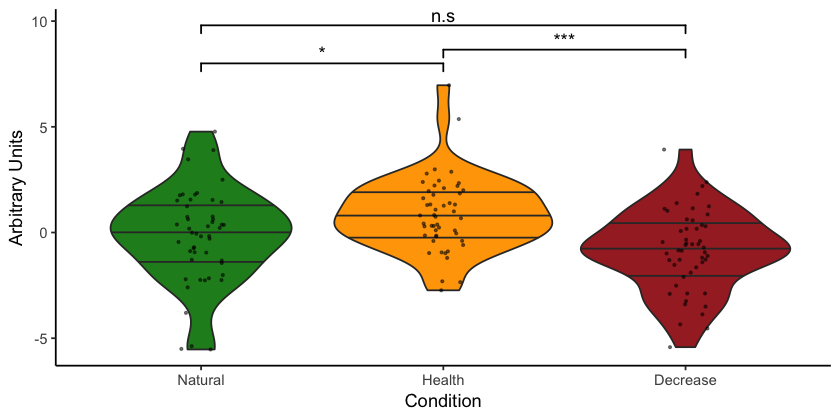

In [162]:
# Plot only vmPFC
plot = ggplot(df[df$roi=="vmPFC",], aes(cond, activation, fill = cond)) +
    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75), size=0.5, 
                alpha=1, show.legend = F) + #draw_quantiles = c(0.5)
    #geom_errorbar(aes(ymin = choice-se, ymax = choice+se), width=0.2, data=accept_rate_group) +
    #geom_boxplot(width = .3) +
    geom_jitter(height = 0, width = 0.1, size = 0.5, alpha=0.5, show.legend = F) +
    xlab("Condition") +
    ylab("Arbitrary Units") +
    scale_fill_manual(values = c("forestgreen", "orange", "brown")) +
    theme_classic()

plot + 
    geom_signif(annotations = c("*", "***", "n.s"),
              y_position = c(8, 8.65, 9.8), xmin=c(1,2,1), xmax=c(2,3,3))

ggsave("../../3_4_outputs/plots/neural_vmPFC_health.pdf", width = 20, height = 15, units = "cm")

#### Health: vmPFC HvN

In [122]:
# make long df
df = vmPFC_HvN %>%
    select(Subject, 
           Natural.Health, Decrease.Health, Health.Health) %>%
    gather("cond", "activation",
          Natural.Health:Health.Health)

In [123]:
df$cond = factor(df$cond, 
                 levels=c("Natural.Health", 
                          "Health.Health",
                         "Decrease.Health"),
                labels=c("Natural", "Health", "Decrease"))
df$Subject = as.factor(df$Subject)

In [126]:
# anova
cond.aov = aov(activation ~ cond + Error(Subject), 
               contrasts = list(cond = "contr.sum"),
               data = df)

print(summary(cond.aov))

# check for pairwise differences
cond.emm = emmeans(cond.aov, list(pairwise ~ cond), adjust = "tukey")
print("Pairwise Comparison (Tukey Corrected)")
print(summary(cond.emm$`pairwise differences of cond`))


Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49  90.03   1.837               

Error: Within
          Df Sum Sq Mean Sq F value    Pr(>F)    
cond       2  35.19  17.593    11.3 0.0000384 ***
Residuals 98 152.57   1.557                      
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
[1] "Pairwise Comparison (Tukey Corrected)"
 contrast            estimate        SE df t.ratio p.value
 Natural - Health   -1.115274 0.2495452 98  -4.469  0.0001
 Natural - Decrease -0.207354 0.2495452 98  -0.831  0.6848
 Health - Decrease   0.907920 0.2495452 98   3.638  0.0013

P value adjustment: tukey method for comparing a family of 3 estimates 


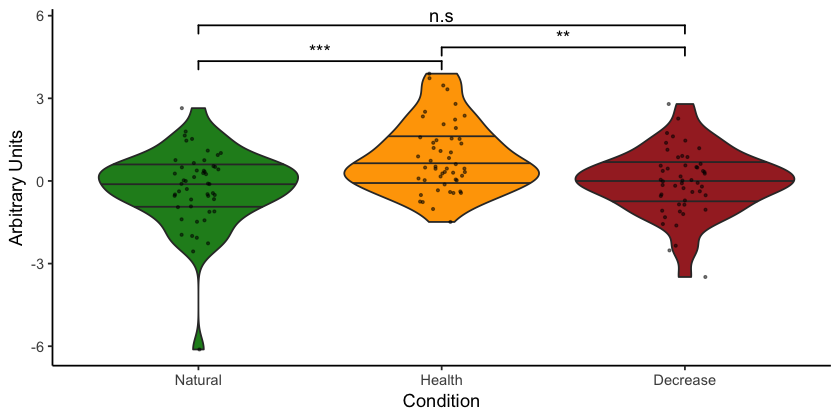

In [133]:
# Plot only vmPFC
plot = ggplot(df, aes(cond, activation, fill = cond)) +
    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75), size=0.5, 
                alpha=1, show.legend = F) + #draw_quantiles = c(0.5)
    #geom_errorbar(aes(ymin = choice-se, ymax = choice+se), width=0.2, data=accept_rate_group) +
    #geom_boxplot(width = .3) +
    geom_jitter(height = 0, width = 0.1, size = 0.5, alpha=0.5, show.legend = F) +
    xlab("Condition") +
    ylab("Arbitrary Units") +
    scale_fill_manual(values = c("forestgreen", "orange", "brown")) +
    theme_classic()

plot + 
    geom_signif(annotations = c("***", "**", "n.s"),
              y_position = c(4.35, 4.85, 5.65), xmin=c(1,2,1), xmax=c(2,3,3))

ggsave("../../3_4_outputs/plots/neural_sv_vmPFC_HvN_health.pdf", width = 20, height = 15, units = "cm")

### Taste Attribute

In [65]:
# make long df
df = rois %>%
    select(Subject, roi, 
           Natural.Taste, Decrease.Taste, Health.Taste) %>%
    gather("cond", "activation",
          Natural.Taste:Health.Taste)

In [66]:
df$cond = factor(df$cond, 
                 levels=c("Natural.Taste",
                          "Health.Taste",
                          "Decrease.Taste"),
                labels=c("Natural", "Health", "Decrease"))

In [67]:
for (mask in c("vmPFC", "R_dlPFC", "L_dlPFC", "L_TPJ", "L_vlPFC")){
    # anova
    cond.aov = aov(activation ~ cond + Error(Subject), 
                   contrasts = list(cond = "contr.sum"),
                   data = filter(df, roi==mask))
    print(mask)
    print("ANOVA")
    print(summary(cond.aov))

    # check for pairwise differences
    cond.emm = emmeans(cond.aov, list(pairwise ~ cond), adjust = "tukey")
    print("Pairwise Comparison (Tukey Corrected)")
    print(summary(cond.emm$`pairwise differences of cond`))
}


[1] "vmPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49  330.3    6.74               

Error: Within
          Df Sum Sq Mean Sq F value Pr(>F)
cond       2    1.9   0.927    0.23  0.795
Residuals 98  395.9   4.039               
[1] "Pairwise Comparison (Tukey Corrected)"
 contrast            estimate        SE df t.ratio p.value
 Natural - Health    0.237948 0.4019642 98   0.592  0.8248
 Natural - Decrease  0.233690 0.4019642 98   0.581  0.8304
 Health - Decrease  -0.004258 0.4019642 98  -0.011  0.9999

P value adjustment: tukey method for comparing a family of 3 estimates 
[1] "R_dlPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49  210.6   4.298               

Error: Within
          Df Sum Sq Mean Sq F value Pr(>F)
cond       2   4.11   2.057   0.673  0.513
Residuals 98 299.60   3.057               
[1] "Pairwise Comparison (Tukey Corrected)"
 contrast           estimate        SE df t.ratio p.value
 Na

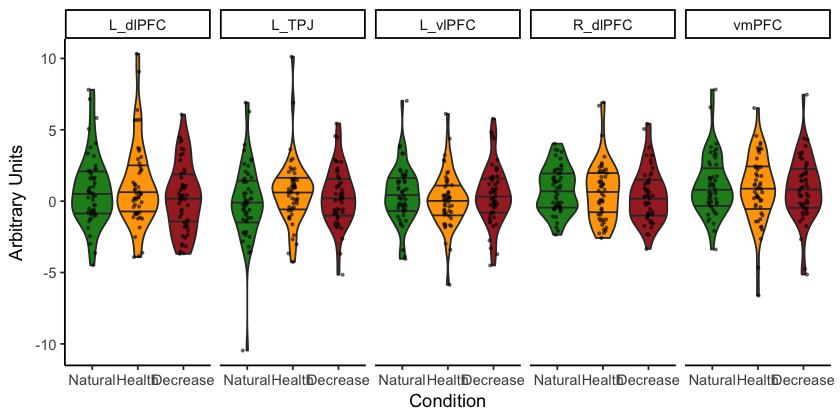

In [152]:
# Plot 
plot = ggplot(df, aes(cond, activation, fill = cond)) +
    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75), size=0.5, alpha=1, show.legend = F) + #draw_quantiles = c(0.5)
    #geom_errorbar(aes(ymin = choice-se, ymax = choice+se), width=0.2, data=accept_rate_group) +
    #geom_boxplot(width = .3) +
    geom_jitter(height = 0, width = 0.1, size = 0.5, alpha=0.5, show.legend = F) +
    xlab("Condition") +
    ylab("Arbitrary Units") +
    scale_fill_manual(values = c("forestgreen", "orange", "brown")) +
    theme_classic()

#plot + facet_grid(roi ~ .)
plot + facet_grid(. ~ roi)

# plot + 
#     geom_signif(annotations = c("n.s", "n.s", "n.s"),
#               y_position = c(9, 10, 11), xmin=c(1,2,1), xmax=c(2,3,3))

### Post - Pre

In [68]:
# make long df
df = rois %>%
    select(Subject, roi, 
           Natural.pre_m_post, Decrease.pre_m_post, Health.pre_m_post) %>%
    gather("cond", "activation",
          Natural.pre_m_post:Health.pre_m_post)

In [69]:
df$cond = factor(df$cond, 
                 levels=c("Natural.pre_m_post",
                          "Health.pre_m_post",
                          "Decrease.pre_m_post"),
                labels=c("Natural", "Health", "Decrease"))

In [70]:
for (mask in c("vmPFC", "R_dlPFC", "L_dlPFC", "L_TPJ", "L_vlPFC")){
    # anova
    cond.aov = aov(activation ~ cond + Error(Subject), 
                   contrasts = list(cond = "contr.sum"),
                   data = filter(df, roi==mask))
    print(mask)
    print("ANOVA")
    print(summary(cond.aov))

    # check for pairwise differences
    cond.emm = emmeans(cond.aov, list(pairwise ~ cond), adjust = "tukey")
    print("Pairwise Comparison (Tukey Corrected)")
    print(summary(cond.emm$`pairwise differences of cond`))
}


[1] "vmPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49    457   9.328               

Error: Within
          Df Sum Sq Mean Sq F value Pr(>F)
cond       2    3.8   1.884   0.145  0.866
Residuals 98 1277.4  13.035               
[1] "Pairwise Comparison (Tukey Corrected)"
 contrast           estimate        SE df t.ratio p.value
 Natural - Health   0.067338 0.7220844 98   0.093  0.9952
 Natural - Decrease 0.364762 0.7220844 98   0.505  0.8690
 Health - Decrease  0.297424 0.7220844 98   0.412  0.9108

P value adjustment: tukey method for comparing a family of 3 estimates 
[1] "R_dlPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49  352.1   7.186               

Error: Within
          Df Sum Sq Mean Sq F value Pr(>F)
cond       2    9.4   4.703   0.942  0.393
Residuals 98  489.0   4.990               
[1] "Pairwise Comparison (Tukey Corrected)"
 contrast            estimate        SE df t.ratio p.value
 Natur

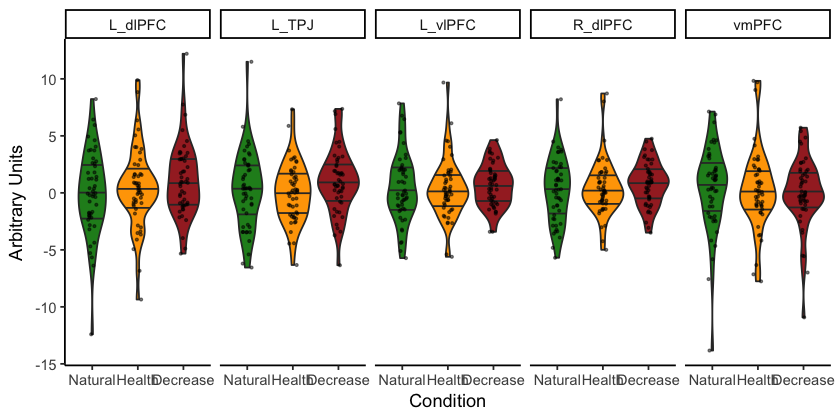

In [169]:
# Plot 
plot = ggplot(df, aes(cond, activation, fill = cond)) +
    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75), size=0.5, alpha=1, show.legend = F) + #draw_quantiles = c(0.5)
    #geom_errorbar(aes(ymin = choice-se, ymax = choice+se), width=0.2, data=accept_rate_group) +
    #geom_boxplot(width = .3) +
    geom_jitter(height = 0, width = 0.1, size = 0.5, alpha=0.5, show.legend = F) +
    xlab("Condition") +
    ylab("Arbitrary Units") +
    scale_fill_manual(values = c("forestgreen", "orange", "brown")) +
    theme_classic()

#plot + facet_grid(roi ~ .)
plot + facet_grid(. ~ roi)

# plot + 
#     geom_signif(annotations = c("n.s", "n.s", "n.s"),
#               y_position = c(9, 10, 11), xmin=c(1,2,1), xmax=c(2,3,3))

### Lasting Success

In [71]:
# make long df
df = rois %>%
    select(Subject, roi, 
           Natural.reg_success_lasting, Decrease.reg_success_lasting, Health.reg_success_lasting) %>%
    gather("cond", "activation",
          Natural.reg_success_lasting:Health.reg_success_lasting)

In [72]:
df$cond = factor(df$cond, 
                 levels=c("Natural.reg_success_lasting",
                          "Health.reg_success_lasting",
                          "Decrease.reg_success_lasting"),
                labels=c("Natural", "Health", "Decrease"))

In [73]:
for (mask in c("vmPFC", "R_dlPFC", "L_dlPFC", "L_TPJ", "L_vlPFC")){
    # anova
    cond.aov = aov(activation ~ cond + Error(Subject), 
                   contrasts = list(cond = "contr.sum"),
                   data = filter(df, roi==mask))
    print(mask)
    print("ANOVA")
    print(summary(cond.aov))

    # check for pairwise differences
    cond.emm = emmeans(cond.aov, list(pairwise ~ cond), adjust = "tukey")
    print("Pairwise Comparison (Tukey Corrected)")
    print(summary(cond.emm$`pairwise differences of cond`))
}


[1] "vmPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49  403.5   8.235               

Error: Within
          Df Sum Sq Mean Sq F value Pr(>F)
cond       2    5.5   2.741   0.349  0.706
Residuals 98  770.2   7.860               
[1] "Pairwise Comparison (Tukey Corrected)"
 contrast            estimate        SE df t.ratio p.value
 Natural - Health   -0.076400 0.5606968 98  -0.136  0.9898
 Natural - Decrease  0.361914 0.5606968 98   0.645  0.7954
 Health - Decrease   0.438314 0.5606968 98   0.782  0.7151

P value adjustment: tukey method for comparing a family of 3 estimates 
[1] "R_dlPFC"
[1] "ANOVA"

Error: Subject
          Df Sum Sq Mean Sq F value Pr(>F)
Residuals 49  237.7    4.85               

Error: Within
          Df Sum Sq Mean Sq F value Pr(>F)  
cond       2   52.8  26.401    3.68 0.0288 *
Residuals 98  703.1   7.174                 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
[1] "Pairwise Comparison (Tukey 

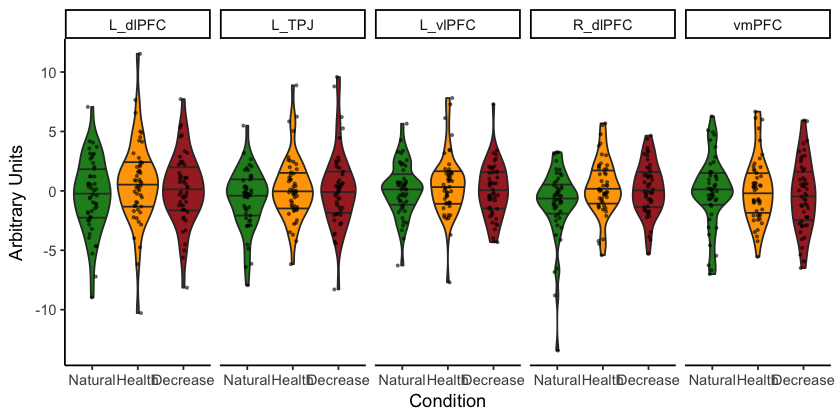

In [173]:
# Plot 
plot = ggplot(df, aes(cond, activation, fill = cond)) +
    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75), size=0.5, alpha=1, show.legend = F) + #draw_quantiles = c(0.5)
    #geom_errorbar(aes(ymin = choice-se, ymax = choice+se), width=0.2, data=accept_rate_group) +
    #geom_boxplot(width = .3) +
    geom_jitter(height = 0, width = 0.1, size = 0.5, alpha=0.5, show.legend = F) +
    xlab("Condition") +
    ylab("Arbitrary Units") +
    scale_fill_manual(values = c("forestgreen", "orange", "brown")) +
    theme_classic()

#plot + facet_grid(roi ~ .)
plot + facet_grid(. ~ roi)

# plot + 
#     geom_signif(annotations = c("n.s", "n.s", "n.s"),
#               y_position = c(9, 10, 11), xmin=c(1,2,1), xmax=c(2,3,3))

In [184]:
m = lm(Health.reg_success_lasting ~ Health.Health, data= filter(rois, roi=="vmPFC"))
summary(m)


Call:
lm(formula = Health.reg_success_lasting ~ Health.Health, data = filter(rois, 
    roi == "vmPFC"))

Residuals:
    Min      1Q  Median      3Q     Max 
-5.3258 -1.7934 -0.1036  1.2361  6.3151 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)
(Intercept)     0.3369     0.4160    0.81    0.422
Health.Health  -0.3275     0.2141   -1.53    0.133

Residual standard error: 2.63 on 48 degrees of freedom
Multiple R-squared:  0.04649,	Adjusted R-squared:  0.02663 
F-statistic:  2.34 on 1 and 48 DF,  p-value: 0.1326


In [175]:
for (mask in c("vmPFC", "R_dlPFC", "L_dlPFC", "L_TPJ", "L_vlPFC")){
    # anova
    cond.aov = aov(activation ~ cond + Error(Subject), 
                   contrasts = list(cond = "contr.sum"),
                   data = filter(df, roi==mask))
    print(mask)
    print("ANOVA")
    print(summary(cond.aov))

    # check for pairwise differences
    cond.emm = emmeans(cond.aov, list(pairwise ~ cond), adjust = "tukey")
    print("Pairwise Comparison (Tukey Corrected)")
    print(summary(cond.emm$`pairwise differences of cond`))
}


Subject,Natural,Decrease,Health,Natural.Preference,Decrease.Preference,Health.Preference,Natural.Taste,Natural.Health,Decrease.Taste,Decrease.Health,Health.Taste,Health.Health,Natural.pre_m_post,Decrease.pre_m_post,Health.pre_m_post,Natural.reg_success_lasting,Decrease.reg_success_lasting,Health.reg_success_lasting,roi
101,11.8387,7.9307,20.5904,6.5749,0.1053,7.5976,3.7952,-1.3264,0.4590,-3.3945,2.3949,-0.3947,-3.4483,-0.2285,-3.6873,2.4299,-4.7984,6.6694,vmPFC
102,18.0133,5.3437,4.2245,1.5320,11.2702,3.0762,1.1856,1.7963,2.9610,1.3921,3.5736,0.2352,1.5392,3.0301,-1.1638,-4.5882,-2.9443,1.5033,vmPFC
103,6.0656,16.1751,27.0601,-1.9928,-0.6882,7.6369,7.8192,-0.6958,2.0651,-3.2444,4.0887,-2.3075,6.8747,2.0688,-0.0702,-1.2652,-6.4971,-4.2331,vmPFC
104,0.6277,1.7987,0.2329,-0.6567,2.7896,-2.0939,-1.2683,4.7724,-0.7917,0.2990,-1.2634,0.4245,1.1454,-0.6714,0.0834,3.6922,-2.5854,-2.1016,vmPFC
106,4.5590,1.5068,-0.0866,-0.4841,-7.3703,1.3134,-0.0938,-1.2907,-0.9528,-3.5006,1.2595,1.9985,0.4538,1.9070,4.1612,0.2145,2.6966,5.9974,vmPFC
107,-6.4475,-8.7135,-4.1616,-1.6090,9.2220,-0.3599,0.5307,-0.0580,-0.2191,-0.5130,3.6332,2.2242,-1.1946,-2.0277,2.0710,1.5889,-2.7520,0.1811,vmPFC


In [ ]:
lm()

## Test Correlations

In [37]:
# create separate dfs for each region:

rois_vmPFC = rois %>%
    filter(roi == "vmPFC")
# this is for the corr function (removes columns we are not interested in correlating)
cor.rois.vmPFC = rois_vmPFC %>%
    select(-c(Subject, roi))

rois_r_dlPFC = rois %>%
    filter(roi == "R_dlPFC")
cor.rois.r_dlPFC = rois_r_dlPFC %>%
    select(-c(Subject, roi))

rois_l_dlPFC = rois %>%
    filter(roi == "L_dlPFC")
cor.rois.l_dlPFC = rois_l_dlPFC %>%
    select(-c(Subject, roi))

In [38]:
# make plots bigger
options(repr.plot.width=11, repr.plot.height=9)

### vmPFC

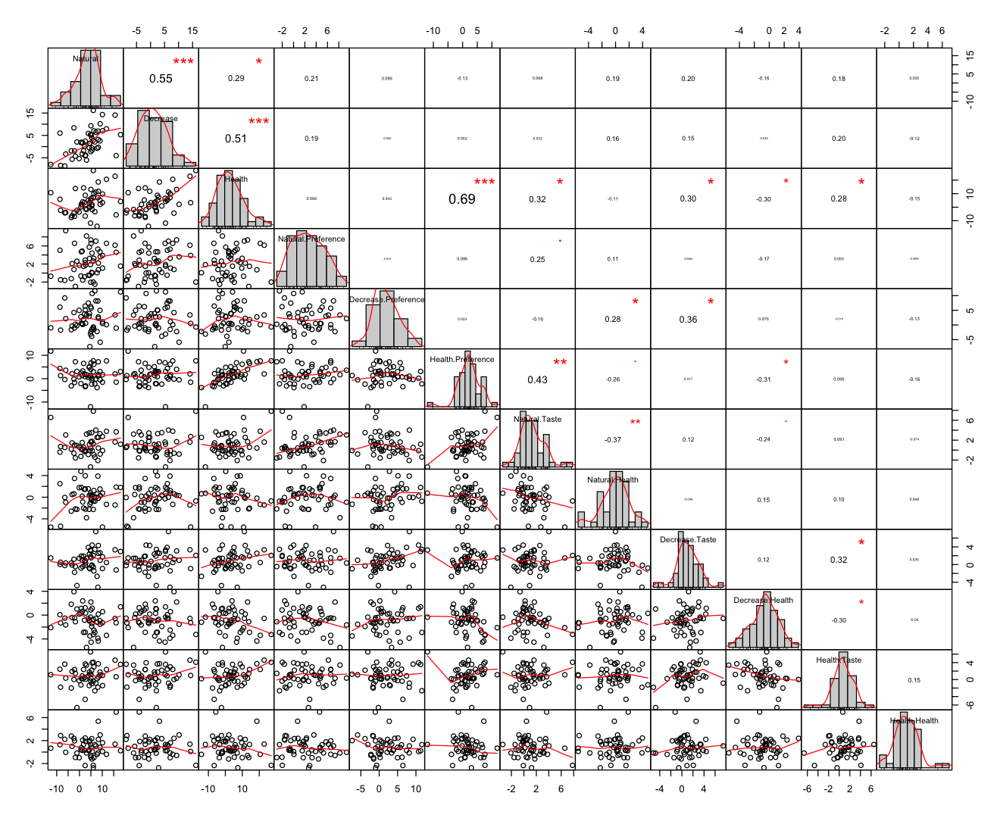

In [39]:
chart.Correlation(cor.rois.vmPFC, histogram=TRUE, pch=19)

### R dlPFC

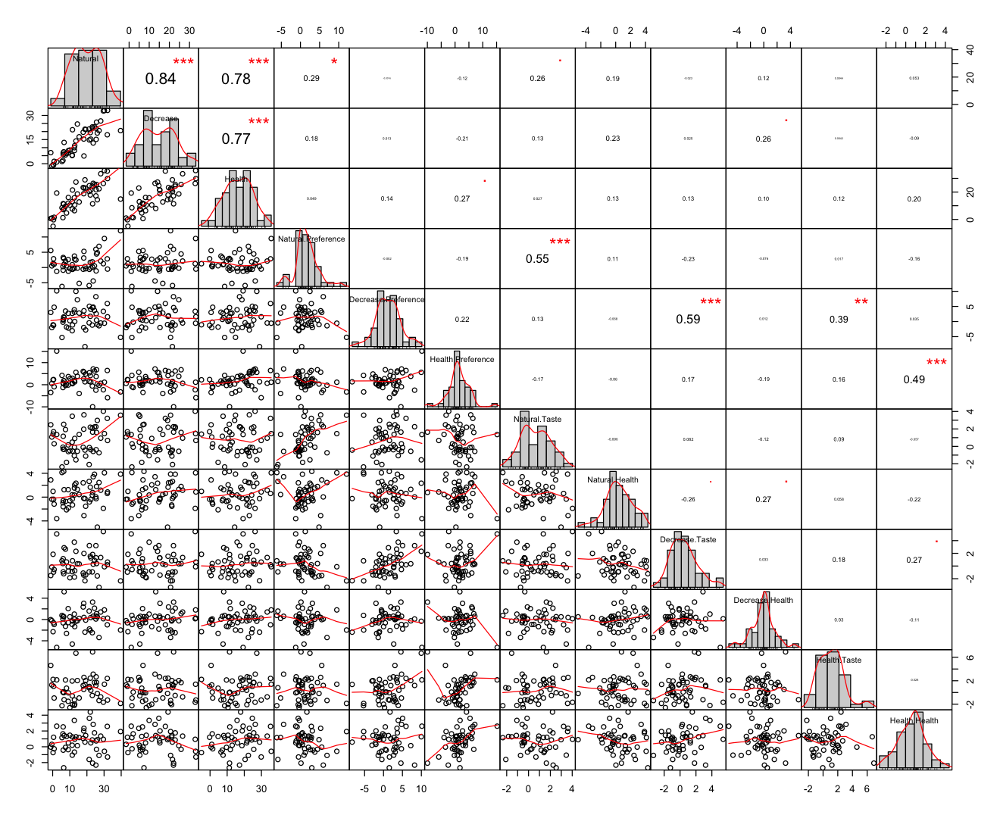

In [40]:
chart.Correlation(cor.rois.r_dlPFC, histogram=TRUE, pch=19)

### L dlPFC

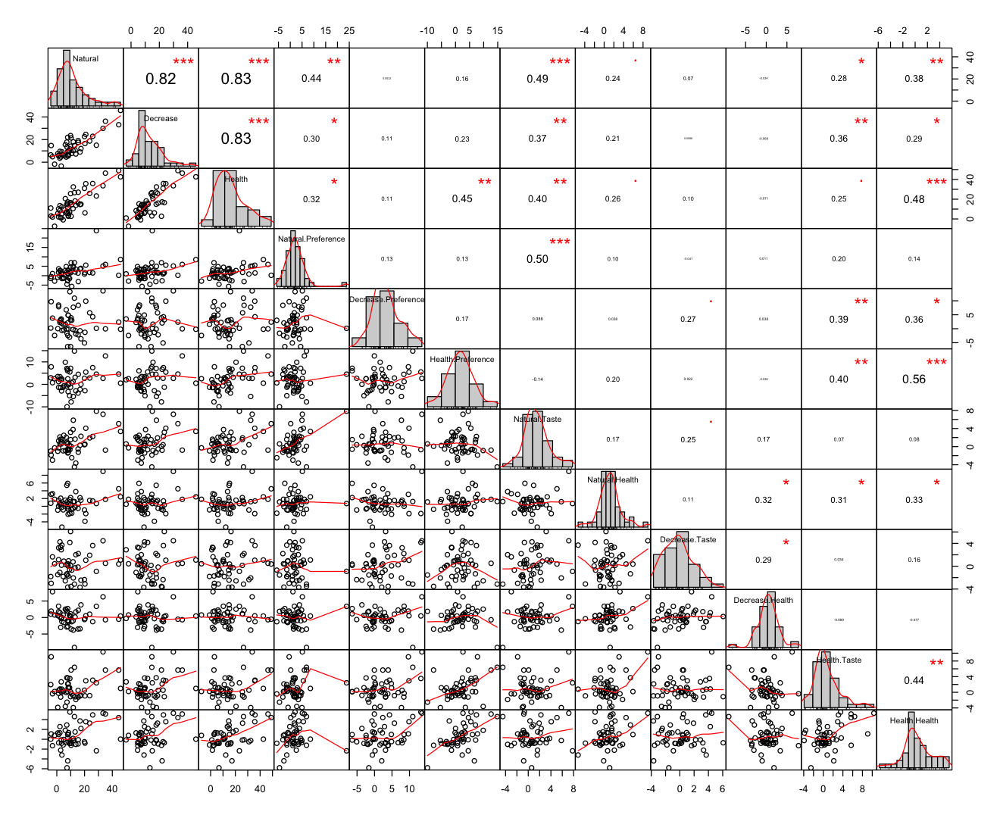

In [41]:
chart.Correlation(cor.rois.l_dlPFC, histogram=TRUE, pch=19)

In [42]:
# correlation with PRE-LIKING?

### Contrast Effects

#### Create contrasts

In [43]:
# Preference modulator
# Health v Natural
rois$HvN.Preference = rois$Health.Preference - rois$Natural.Preference
# Decrease v Natural
rois$DvN.Preference = rois$Decrease.Preference - rois$Natural.Preference
# Regulation v Natural
rois$RvN.Preference = rois$Decrease.Preference + rois$Health.Preference - (2 * rois$Natural.Preference)

# Taste and Health modulators
# Health v Natural
rois$HvN.Taste = rois$Health.Taste - rois$Natural.Taste
rois$HvN.Health = rois$Health.Health - rois$Natural.Health
# Decrease v Natural
rois$DvN.Taste = rois$Decrease.Taste - rois$Natural.Taste
rois$DvN.Health = rois$Decrease.Health - rois$Natural.Health
# Reg v Natural
rois$RvN.Taste = rois$Decrease.Taste + rois$Health.Taste - (2 * rois$Natural.Taste)
rois$RvN.Health = rois$Decrease.Health +  rois$Health.Health - (2 * rois$Natural.Health)

# Main effect of condition
# Health v Natural
rois$HvN = rois$Health - rois$Natural
# Decrease v Natural
rois$DvN = rois$Decrease - rois$Natural
# Regulation v Natural
rois$RvN =  rois$Health + rois$Decrease - (2 * rois$Natural)

In [44]:
# indicate columns to keep for corr testing
contrasts = (c("HvN.Preference", "DvN.Preference", "RvN.Preference",
             "HvN.Taste", "DvN.Taste", "RvN.Taste",
             "HvN.Health", "DvN.Health", "RvN.Health",
             "HvN", "DvN", "RvN")) 

contrast_rois_vmPFC = rois %>%
    filter(roi == "vmPFC") %>%
    select(contrasts)

contrast_rois_r_dlPFC = rois %>%
    filter(roi == "R_dlPFC") %>%
    select(contrasts)

contrast_rois_l_dlPFC = rois %>%
    filter(roi == "L_dlPFC") %>%
    select(contrasts)

#### Test contrasts

##### vmPFC

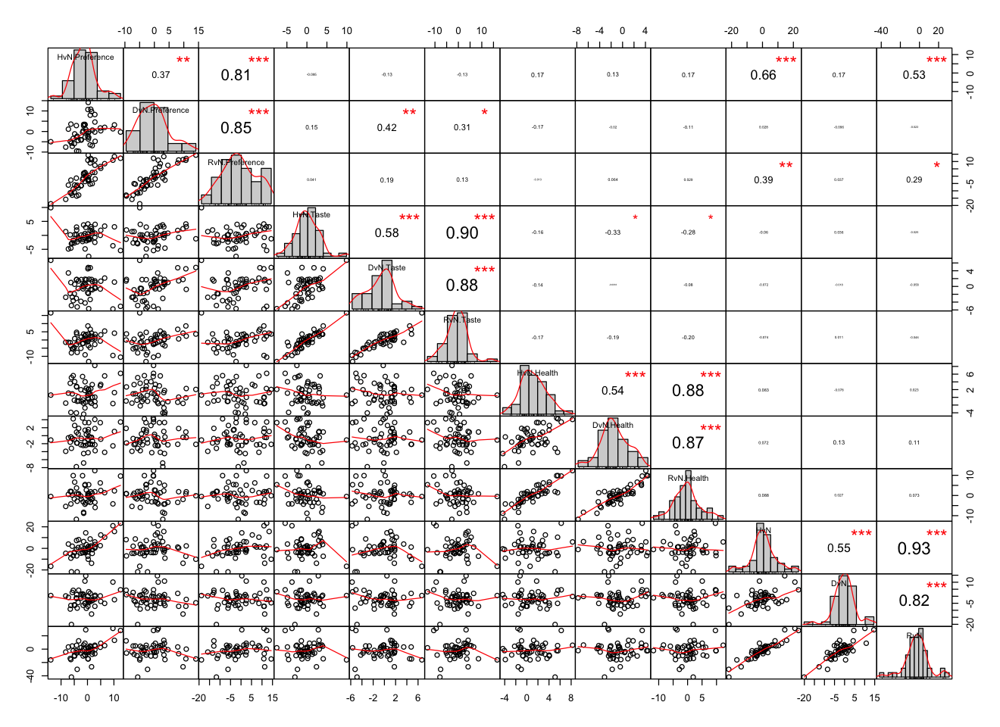

In [45]:
options(repr.plot.width=11, repr.plot.height=8)
chart.Correlation(contrast_rois_vmPFC, histogram=TRUE, pch=19)

##### R dlPFC

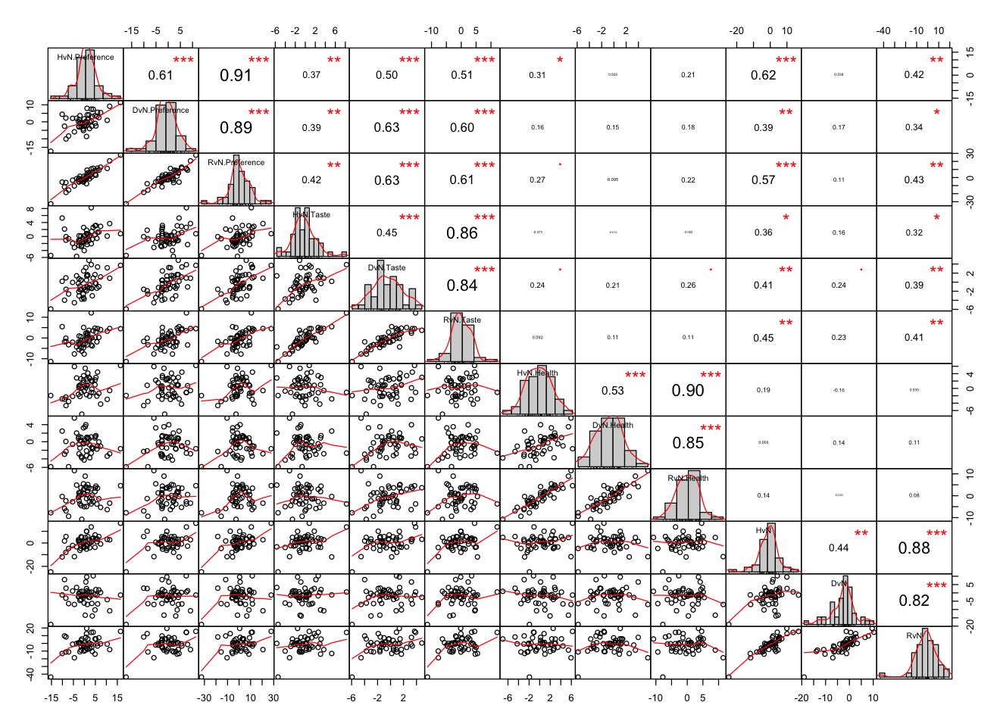

In [46]:
chart.Correlation(contrast_rois_r_dlPFC, histogram=TRUE, pch=19)

##### L dlPFC

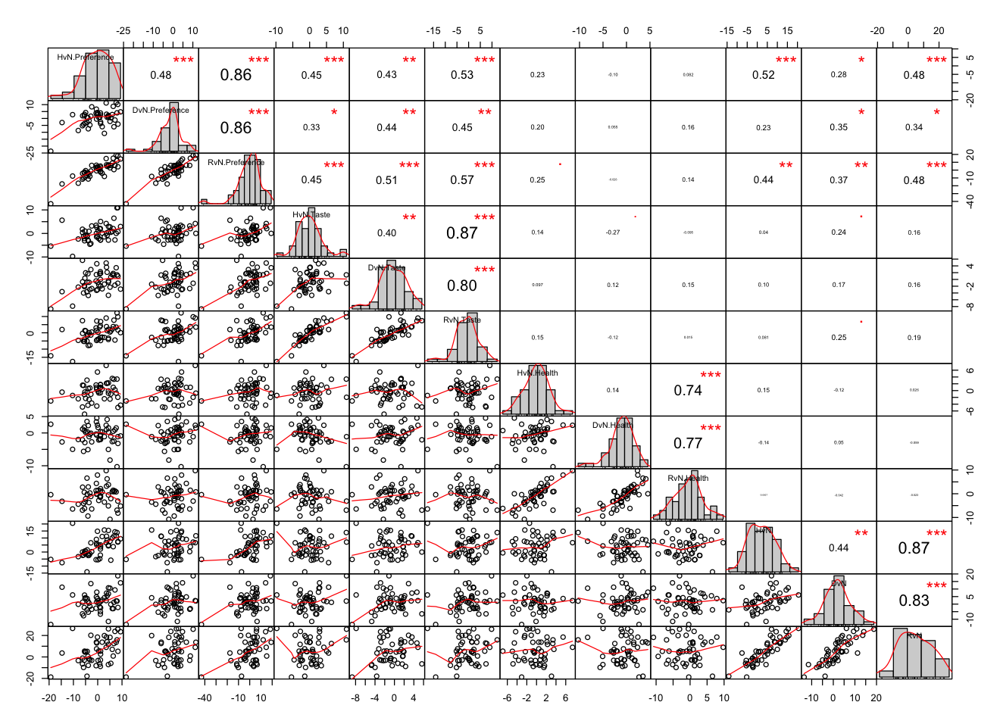

In [47]:
chart.Correlation(contrast_rois_l_dlPFC, histogram=TRUE, pch=19)

## Regulatory Effects: Lasting

### Setup

#### Load Data

Load data created in `fr_behavioral`

Section
* Health Cond: Regulatory Success ~ $\Delta$Health Weight + $\Delta$Taste Weight


In [79]:
reg_success_lasting = readRDS("../data/reg_success_lasting.rds")

# need to look only at the subjects that were kept
good_subjects = unique(rois$Subject)
# remove "bad" subjects
reg_success_lasting = reg_success_lasting %>%
    filter(subject %in% good_subjects)

In [80]:
# join this with the rois df HEALTH condition
reg_success_rois = rois %>%
    group_by(roi) %>%
    mutate(Health.hw_change = reg_success_lasting$hw,
          Health.tw_change = reg_success_lasting$tw,
          Health.success_lasting_change = reg_success_lasting$successful_lasting_change)

In [81]:
# successful lasting regulation (based on post pre)
# correlates with activity in any brain areas

In [82]:
head(reg_success_rois)

Subject,Natural,Decrease,Health,Natural.Preference,Decrease.Preference,Health.Preference,Natural.Taste,Natural.Health,Decrease.Taste,⋯,DvN.Taste,DvN.Health,RvN.Taste,RvN.Health,HvN,DvN,RvN,Health.hw_change,Health.tw_change,Health.success_lasting_change
101,11.8387,7.9307,20.5904,6.5749,0.1053,7.5976,3.7952,-1.3264,0.4590,⋯,-3.3362,-2.0681,-4.7365,-1.1364,8.7517,-3.9080,4.8437,0.09061531,-0.13918720,0.06636501
102,18.0133,5.3437,4.2245,1.5320,11.2702,3.0762,1.1856,1.7963,2.9610,⋯,1.7754,-0.4042,4.1634,-1.9653,-13.7888,-12.6696,-26.4584,0.19347491,-0.13288500,0.04616240
103,6.0656,16.1751,27.0601,-1.9928,-0.6882,7.6369,7.8192,-0.6958,2.0651,⋯,-5.7541,-2.5486,-9.4846,-4.1603,20.9945,10.1095,31.1040,-0.06869938,-0.06699850,-0.89846154
104,0.6277,1.7987,0.2329,-0.6567,2.7896,-2.0939,-1.2683,4.7724,-0.7917,⋯,0.4766,-4.4734,0.4815,-8.8213,-0.3948,1.1710,0.7762,0.13587729,-0.09584388,-0.17373737
106,4.5590,1.5068,-0.0866,-0.4841,-7.3703,1.3134,-0.0938,-1.2907,-0.9528,⋯,-0.8590,-2.2099,0.4943,1.0793,-4.6456,-3.0522,-7.6978,0.19964422,-0.11030066,1.22716628
107,-6.4475,-8.7135,-4.1616,-1.6090,9.2220,-0.3599,0.5307,-0.0580,-0.2191,⋯,-0.7498,-0.4550,2.3527,1.8272,2.2859,-2.2660,0.0199,0.39732756,-0.49607212,1.44193062


In [83]:
# indicate columns to keep for corr testing
reg_success_rois_vmPFC = reg_success_rois %>%
    filter(roi == "vmPFC") %>%
    ungroup() %>%
    select(-c(Subject, roi))

reg_success_rois_r_dlPFC = reg_success_rois %>%
    filter(roi == "R_dlPFC") %>%
    ungroup() %>%
    select(-c(Subject, roi))

reg_success_rois_l_dlPFC = reg_success_rois %>%
    filter(roi == "L_dlPFC") %>%
    ungroup() %>%
    select(-c(Subject, roi))

#### Helper Function

In [84]:
# ++++++++++++++++++++++++++++
# flattenCorrMatrix
# ++++++++++++++++++++++++++++
# cormat : matrix of the correlation coefficients
# pmat : matrix of the correlation p-values
flattenCorrMatrix <- function(cormat, pmat) {
  ut <- upper.tri(cormat)
  data.frame(
    row = rownames(cormat)[row(cormat)[ut]],
    column = rownames(cormat)[col(cormat)[ut]],
    cor  =(cormat)[ut],
    p = pmat[ut]
    )
}

### vmPFC

In [85]:
res2<-rcorr(as.matrix(reg_success_rois_vmPFC[,]))
corrs = flattenCorrMatrix(res2$r, res2$P)

# Set sig level and reorder
corrs_sig = corrs[corrs$p<0.05,]
corrs_sig_ordered = corrs_sig[order(corrs_sig$p),]

paste0(dim(corrs_sig_ordered)[1], " significant correlations.")
corrs_sig_ordered[corrs_sig_ordered$column=="Health.success_lasting_change",]

[1] "83 significant correlations."

,row,column,cor,p
350,Health.hw_change,Health.success_lasting_change,0.4062779,0.003416137
327,Decrease,Health.success_lasting_change,-0.3266451,0.020601100


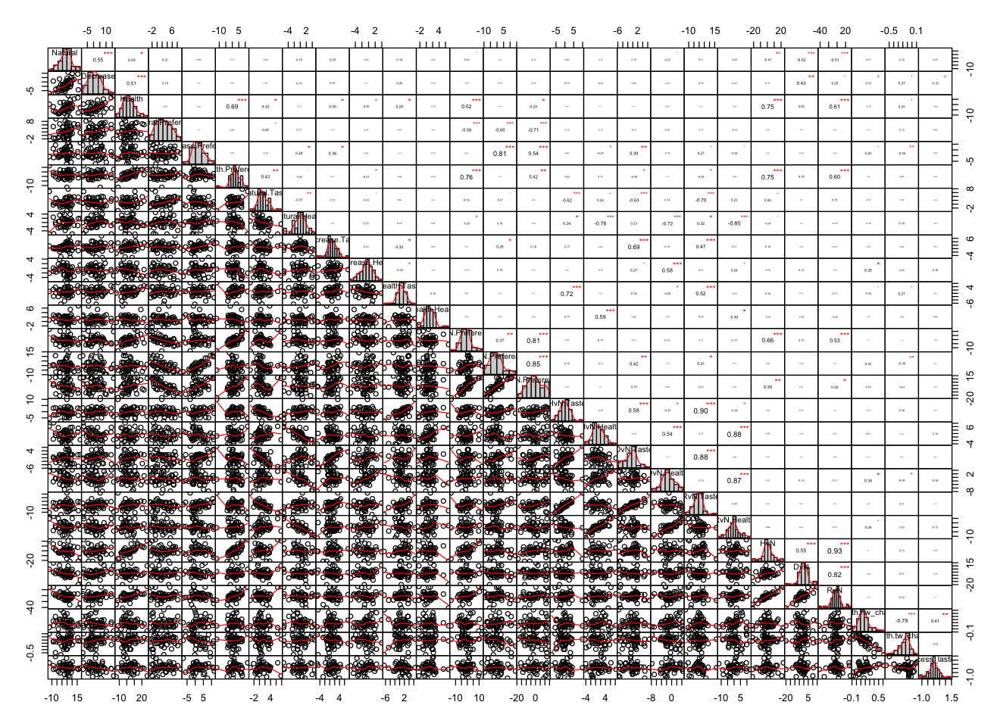

In [86]:
chart.Correlation(reg_success_rois_vmPFC, histogram=TRUE, pch=19)

### R dlPFC

In [87]:
res2<-rcorr(as.matrix(reg_success_rois_r_dlPFC[,]))
corrs = flattenCorrMatrix(res2$r, res2$P)

# Set sig level and reorder
corrs_sig = corrs[corrs$p<0.05,]
corrs_sig_ordered = corrs_sig[order(corrs_sig$p),]

paste0(dim(corrs_sig_ordered)[1], " significant correlations.")
corrs_sig_ordered[corrs_sig_ordered$column=="Health.success_lasting_change",]

[1] "90 significant correlations."

,row,column,cor,p
350,Health.hw_change,Health.success_lasting_change,0.4062779,0.003416137


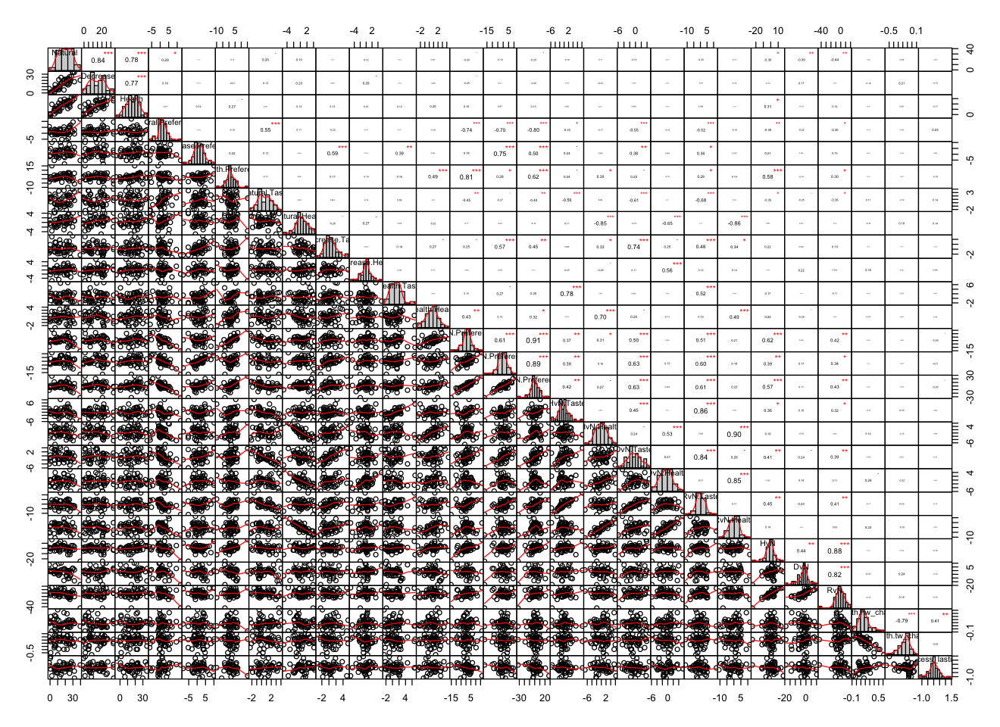

In [88]:
chart.Correlation(reg_success_rois_r_dlPFC, histogram=TRUE, pch=19)

### L dlPFC

In [89]:
res2<-rcorr(as.matrix(reg_success_rois_l_dlPFC[,]))
corrs = flattenCorrMatrix(res2$r, res2$P)

# Set sig level and reorder
corrs_sig = corrs[corrs$p<0.05,]
corrs_sig_ordered = corrs_sig[order(corrs_sig$p),]

paste0(dim(corrs_sig_ordered)[1], " significant correlations.")
corrs_sig_ordered[corrs_sig_ordered$column=="Health.success_lasting_change",]

[1] "104 significant correlations."

,row,column,cor,p
350,Health.hw_change,Health.success_lasting_change,0.4062779,0.003416137
335,Decrease.Health,Health.success_lasting_change,0.3539061,0.011689358
344,DvN.Health,Health.success_lasting_change,0.2888459,0.041913426


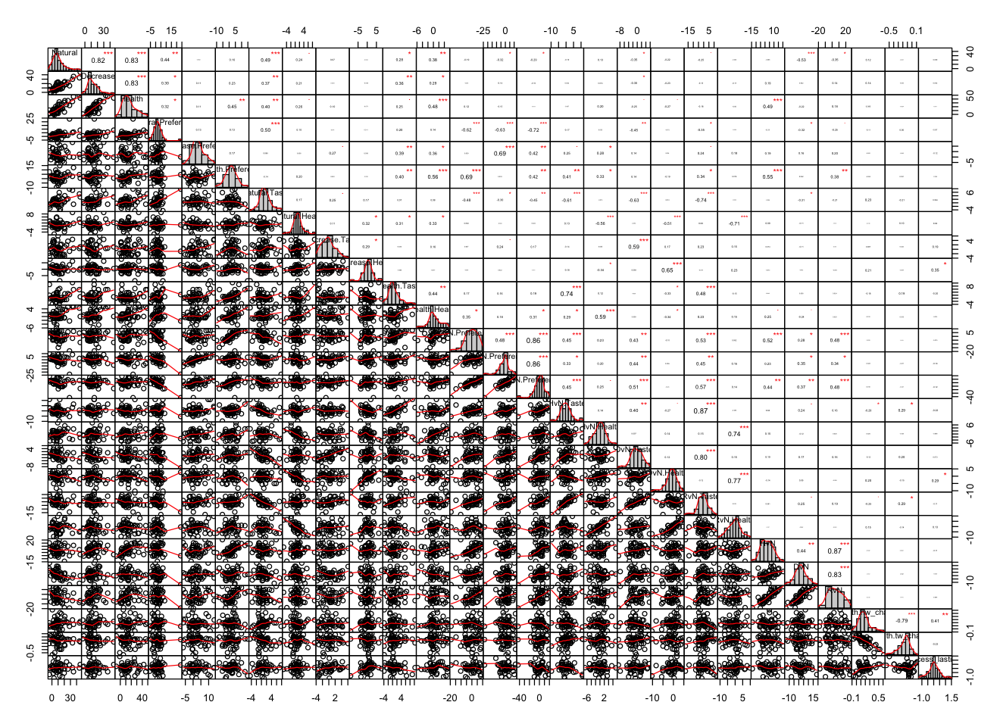

In [90]:
chart.Correlation(reg_success_rois_l_dlPFC, histogram=TRUE, pch=19)

## Regulatory Effects: Trial

### Setup

#### Load Data

Load data created in `fr_behavioral`

In [91]:
reg_success_trial = readRDS("../data/reg_success_trial.rds")

# need to look only at the subjects that were kept
good_subjects = unique(rois$Subject)
# remove "bad" subjects
reg_success_trial = reg_success_trial %>%
    filter(Subject %in% good_subjects)

In [92]:
head(reg_success_trial,3)

Subject,Health.success_trial,Decrease.success_trial,Natural.hw,Health.hw,Decrease.hw,Natural.tw,Health.tw,Decrease.tw
101,0.229802510,0.09816493,0.10423377,0.19484908,0.07434354,0.4155784,0.2763912,0.3174135
102,0.326359912,0.02674156,0.09125025,0.28472517,0.12059167,0.2811279,0.1482429,0.2543863
103,-0.001700882,0.05332313,0.14808818,0.07938879,0.04199201,0.2693912,0.2023927,0.2160681


In [93]:
# join this with the rois from 2.3
reg_success_rois2 = reg_success_rois %>%
    group_by(roi) %>%
    left_join(reg_success_trial, by="Subject")

In [94]:
# successful lasting regulation (based on post pre)
# correlates with activity in any brain areas

In [95]:
head(reg_success_rois2,2)

Subject,Natural,Decrease,Health,Natural.Preference,Decrease.Preference,Health.Preference,Natural.Taste,Natural.Health,Decrease.Taste,⋯,Health.tw_change,Health.success_lasting_change,Health.success_trial,Decrease.success_trial,Natural.hw,Health.hw,Decrease.hw,Natural.tw,Health.tw,Decrease.tw
101,11.8387,7.9307,20.5904,6.5749,0.1053,7.5976,3.7952,-1.3264,0.459,⋯,-0.1391872,0.06636501,0.2298025,0.09816493,0.10423377,0.1948491,0.07434354,0.4155784,0.2763912,0.3174135
102,18.0133,5.3437,4.2245,1.5320,11.2702,3.0762,1.1856,1.7963,2.961,⋯,-0.1328850,0.04616240,0.3263599,0.02674156,0.09125025,0.2847252,0.12059167,0.2811279,0.1482429,0.2543863


In [96]:
# create df for each brain region for corr testing
# indicate columns to keep for corr testing
reg_success_rois_vmPFC = reg_success_rois2 %>%
    filter(roi == "vmPFC") %>%
    ungroup() %>%
    select(-c(Subject, roi, Health.hw_change, Health.tw_change, Health.success_lasting_change))

reg_success_rois_r_dlPFC = reg_success_rois2 %>%
    filter(roi == "R_dlPFC") %>%
    ungroup() %>%
    select(-c(Subject, roi, Health.hw_change, Health.tw_change, Health.success_lasting_change))

reg_success_rois_l_dlPFC = reg_success_rois2 %>%
    filter(roi == "L_dlPFC") %>%
    ungroup() %>%
    select(-c(Subject, roi, Health.hw_change, Health.tw_change, Health.success_lasting_change))

### vmPFC

In [97]:
res2<-rcorr(as.matrix(reg_success_rois_vmPFC[,]))
corrs = flattenCorrMatrix(res2$r, res2$P)

# Set sig level and reorder
corrs_sig = corrs[corrs$p<0.05,]
corrs_sig_ordered = corrs_sig[order(corrs_sig$p),]

paste0(dim(corrs_sig_ordered)[1], " significant correlations.")
corrs_sig_ordered[(corrs_sig_ordered$column=="Health.success_trial") | (corrs_sig_ordered$column=="Decrease.success_trial"),]

[1] "111 significant correlations."

,row,column,cor,p
325,Health.success_trial,Decrease.success_trial,0.6623562,0.0000001613809
311,Health.Taste,Decrease.success_trial,-0.4239374,0.0021550778303
295,DvN.Health,Health.success_trial,0.3404025,0.0155695915402
281,Decrease.Preference,Health.success_trial,0.3269335,0.0204830179543
309,Decrease.Taste,Decrease.success_trial,-0.3115740,0.0276240201229
290,DvN.Preference,Health.success_trial,0.3082775,0.0294009487538
278,Decrease,Health.success_trial,-0.3023940,0.0328088310434


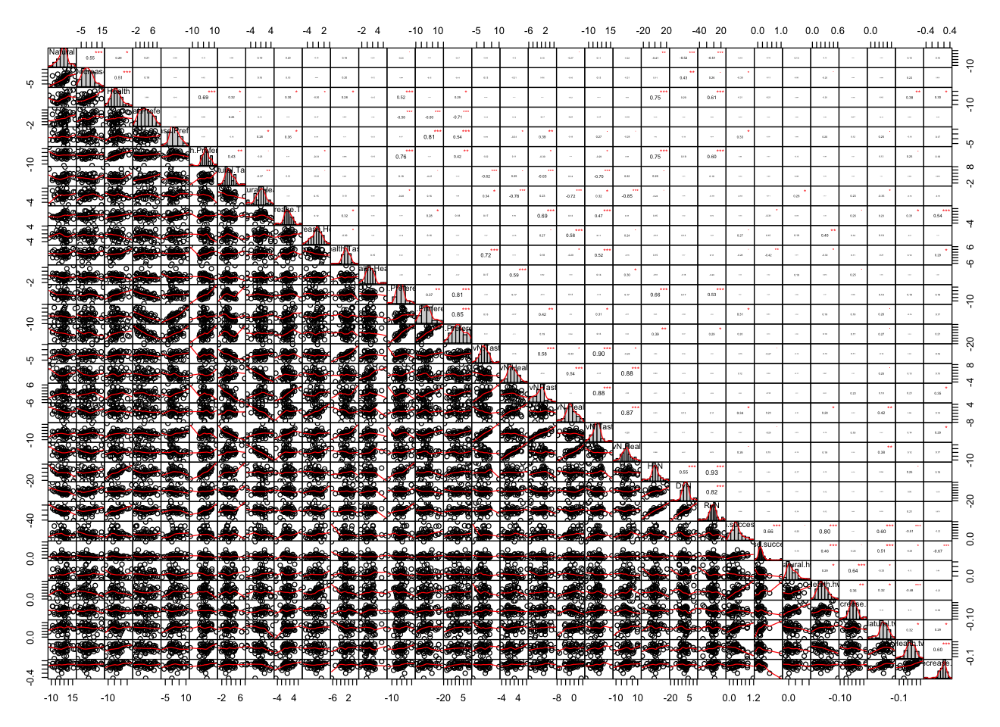

In [98]:
chart.Correlation(reg_success_rois_vmPFC, histogram=TRUE, pch=19)

### R dlPFC

In [99]:
res2<-rcorr(as.matrix(reg_success_rois_r_dlPFC[,]))
corrs = flattenCorrMatrix(res2$r, res2$P)

# Set sig level and reorder
corrs_sig = corrs[corrs$p<0.05,]
corrs_sig_ordered = corrs_sig[order(corrs_sig$p),]

paste0(dim(corrs_sig_ordered)[1], " significant correlations.")
corrs_sig_ordered[(corrs_sig_ordered$column=="Health.success_trial") | (corrs_sig_ordered$column=="Decrease.success_trial"),]

[1] "116 significant correlations."

,row,column,cor,p
325,Health.success_trial,Decrease.success_trial,0.6623562,0.0000001613809


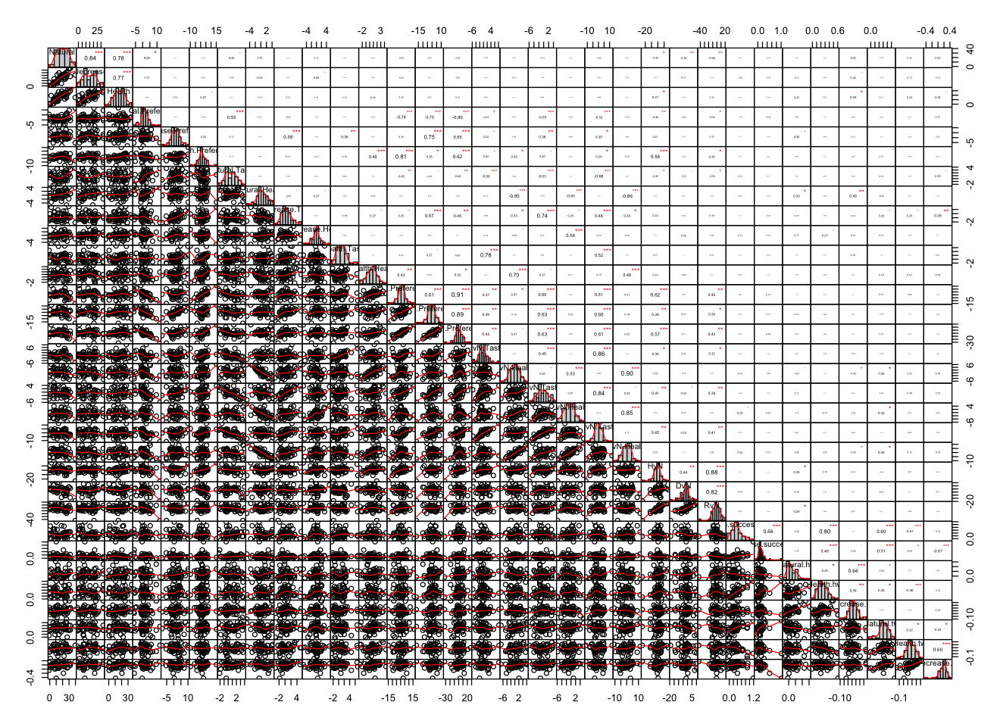

In [100]:
chart.Correlation(reg_success_rois_r_dlPFC, histogram=TRUE, pch=19)

### L dlPFC

In [101]:
res2<-rcorr(as.matrix(reg_success_rois_r_dlPFC[,]))
corrs = flattenCorrMatrix(res2$r, res2$P)

# Set sig level and reorder
corrs_sig = corrs[corrs$p<0.05,]
corrs_sig_ordered = corrs_sig[order(corrs_sig$p),]

paste0(dim(corrs_sig_ordered)[1], " significant correlations.")
corrs_sig_ordered[(corrs_sig_ordered$column=="Health.success_trial") | (corrs_sig_ordered$column=="Decrease.success_trial"),]

[1] "116 significant correlations."

,row,column,cor,p
325,Health.success_trial,Decrease.success_trial,0.6623562,0.0000001613809


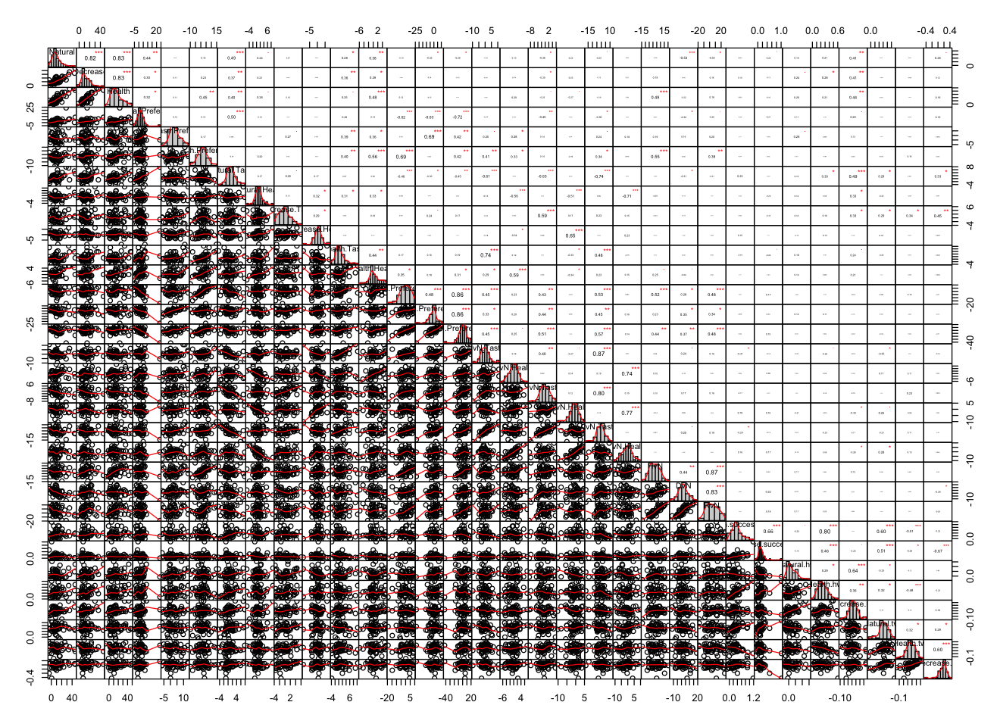

In [102]:
chart.Correlation(reg_success_rois_l_dlPFC, histogram=TRUE, pch=19)

### Multiple Regression

#### Wide version of data

In [69]:
# get list of column names without Subject and roi to use for dcast
x = names(reg_success_rois2)
var.names = x[(x != "Subject") & (x != "roi")] # without elements that are "b"

In [73]:
# make data wide (based on ROIs)
reg_success_rois2_wide = dcast(setDT(reg_success_rois2), Subject~roi, value.var = var.names)

#### Lasting Success

##### Health Condition

In [ ]:
reg_success_rois2_wide$Health.He

In [111]:
Health.fit_trial_success = lm(Health.success_trial_vmPFC ~ 
                              Health.Health_vmPFC * 
                              Health.Health_R_dlPFC * 
                              Health.Health_L_dlPFC,
                              data=reg_success_rois2_wide)
summary(Health.fit_trial_success)


Call:
lm(formula = Health.success_trial_vmPFC ~ Health.Health_vmPFC * 
    Health.Health_R_dlPFC * Health.Health_L_dlPFC, data = reg_success_rois2_wide)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.40269 -0.17425 -0.03221  0.12203  0.79644 

Coefficients:
                                                                  Estimate
(Intercept)                                                      0.3364170
Health.Health_vmPFC                                              0.0118297
Health.Health_R_dlPFC                                            0.0503123
Health.Health_L_dlPFC                                           -0.0007046
Health.Health_vmPFC:Health.Health_R_dlPFC                       -0.0374975
Health.Health_vmPFC:Health.Health_L_dlPFC                       -0.0029516
Health.Health_R_dlPFC:Health.Health_L_dlPFC                     -0.0169240
Health.Health_vmPFC:Health.Health_R_dlPFC:Health.Health_L_dlPFC  0.0091231
                                                    

In [112]:
Health.fit_trial_success = lm(Health.success_trial_vmPFC ~ 
                              Health.Taste_vmPFC *
                              Health.Taste_R_dlPFC*
                              Health.Taste_L_dlPFC,
                              data=reg_success_rois2_wide)
summary(Health.fit_trial_success)


Call:
lm(formula = Health.success_trial_vmPFC ~ Health.Taste_vmPFC * 
    Health.Taste_R_dlPFC * Health.Taste_L_dlPFC, data = reg_success_rois2_wide)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.45938 -0.10321 -0.02175  0.09858  0.61903 

Coefficients:
                                                              Estimate
(Intercept)                                                   0.340308
Health.Taste_vmPFC                                           -0.022531
Health.Taste_R_dlPFC                                          0.044762
Health.Taste_L_dlPFC                                         -0.019638
Health.Taste_vmPFC:Health.Taste_R_dlPFC                      -0.014425
Health.Taste_vmPFC:Health.Taste_L_dlPFC                       0.011718
Health.Taste_R_dlPFC:Health.Taste_L_dlPFC                     0.012212
Health.Taste_vmPFC:Health.Taste_R_dlPFC:Health.Taste_L_dlPFC -0.006696
                                                             Std. Error t value
(Intercept)

In [108]:
Health.fit_lasting_success = lm(Health.success_lasting_change_vmPFC ~ 
                                Health.Health_vmPFC * 
                                Health.Health_R_dlPFC * 
                                Health.Health_L_dlPFC,
                                data=reg_success_rois2_wide)
summary(Health.fit_lasting_success)


Call:
lm(formula = Health.success_lasting_change_vmPFC ~ Health.Health_vmPFC * 
    Health.Health_R_dlPFC * Health.Health_L_dlPFC, data = reg_success_rois2_wide)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.1946 -0.2912  0.0364  0.2698  1.1646 

Coefficients:
                                                                 Estimate
(Intercept)                                                      0.062025
Health.Health_vmPFC                                              0.073322
Health.Health_R_dlPFC                                            0.081728
Health.Health_L_dlPFC                                           -0.024188
Health.Health_vmPFC:Health.Health_R_dlPFC                       -0.077148
Health.Health_vmPFC:Health.Health_L_dlPFC                        0.001528
Health.Health_R_dlPFC:Health.Health_L_dlPFC                     -0.014846
Health.Health_vmPFC:Health.Health_R_dlPFC:Health.Health_L_dlPFC  0.014848
                                                              

In [464]:
fit_health = lm(Health.success_trial ~ Health.Health[roi=="vmPFC",] + Health.Health + Health.Health,
                data=reg_success_rois_vmPFC)

In [ ]:
fit <- lm(y ~ x1 + x2 + x3, data=mydata)
summary(fit) # show results

In [294]:
pander(cor.test(health_rois_vmPFC$Health, health_rois_vmPFC$Health.hw_change))
pander(cor.test(health_rois_vmPFC$Health.Health, health_rois_vmPFC$Health.hw_change))



| Test statistic | df | P value | Alternative hypothesis |   cor   |
|:--------------:|:--:|:-------:|:----------------------:|:-------:|
|     -1.049     | 48 | 0.2996  |       two.sided        | -0.1497 |

Table: Pearson's product-moment correlation: `health_rois_vmPFC$Health` and `health_rois_vmPFC$Health.hw`



| Test statistic | df | P value | Alternative hypothesis |   cor    |
|:--------------:|:--:|:-------:|:----------------------:|:--------:|
|    -0.2523     | 48 | 0.8019  |       two.sided        | -0.03639 |

Table: Pearson's product-moment correlation: `health_rois_vmPFC$Health.Health` and `health_rois_vmPFC$Health.hw`



In [ ]:
# successful momentary regulation (based on weight change)
# correlates with activity in any brain areas?

# Outputs for `SPM`

## `lm` to Predict Preference

Need to make a `lm` for each subject that indicates how their in-trial choice relates to their pre-liking in the **Natural** conditoin.

Use this in Matlab file `foodreg_m6_preference_a_reg_success_momentary_analyze2.m` to create an expected value for the **regulatory** trials.

In [49]:
library(R.matlab)

R.matlab v3.6.2 (2018-09-26) successfully loaded. See ?R.matlab for help.

Attaching package: ‘R.matlab’

The following objects are masked from ‘package:base’:

    getOption, isOpen



In [53]:
# calculate lm for all each sub
sub_lms = dt %>%
    filter(cond == "Respond Naturally") %>%
    group_by(subject) %>%
    mutate(intercept = lm(resp ~ pre_liking)$coefficients[[1]],
          pre_liking_beta = lm(resp ~ pre_liking)$coefficients[[2]]) %>%
    summarise(intercept = mean(intercept), pre_liking_beta = mean(pre_liking_beta)) %>%
    select(subject, intercept, pre_liking_beta)

In [54]:
# each subject gets an intercept and beta
head(sub_lms, 3)

subject,intercept,pre_liking_beta
101,0.06565657,0.5909091
102,0.98634359,0.2046565
103,1.37794164,0.3773141


In [51]:
# save as matlab file
writeMat(con="../data/subjects/sub_lms.mat", sub_lms=as.matrix(sub_lms))